# Описание данных

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.  
Для начала  необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.\
Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Файл moscow_places.csv:  
- name — название заведения;
- address — адрес заведения;  
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
- hours — информация о днях и часах работы;  
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: \
«Средний счёт: 1000–1500 ₽»; \
«Цена чашки капучино: 130–220 ₽»; \
«Цена бокала пива: 400–600 ₽». \
и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»: \
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений. \
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число. \
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: \
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений. \
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число. \
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки): \
0 — заведение не является сетевым \
1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

# Задачи

1) Обработать данные для дальнейшего анализа.  
2) Проанализировать данные:
- Какие категории заведений представлены в данных?
- Количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее.
- Соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
- Какие категории заведений чаще являются сетевыми?
- Топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?
- Какие административные районы Москвы присутствуют в датасете?
- Визуализация распределения средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?
- Построить хороплёт со средним рейтингом заведений каждого района.
- Отобразить все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
- Найти улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?
- Проанализировать цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?
- Исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений и проверить прочие взаимосвязи.  
  
3) Детализация исследования:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
- Построить визуализации и дать рекомендации для открытия нового заведения.  
  
4) Подготовить презентацию для инвесторов.

## Изучение данных

In [1]:
import pandas as pd
import numpy as np
from numpy import median, mean

import seaborn as sns
from matplotlib import pyplot as plt
import plotly.express as px
from plotly import graph_objects as go

import os

import folium
from folium import Marker, Map
from folium import Choropleth
from folium.plugins import MarkerCluster

pd.set_option('display.max_colwidth', 500)
pd.set_option('display.float_format', '{:.2f}'.format)
sns.set_style("whitegrid")

from pandas.plotting import register_matplotlib_converters

import warnings
warnings.filterwarnings('ignore')

In [2]:
h_pth1 = 'C://Users/drweb/Downloads/moscow_places.csv'
h_pth2 = '/datasets/moscow_places.csv'

if os.path.exists(h_pth1):
    mp = pd.read_csv(h_pth1, sep = ',')
elif os.path.exists(h_pth2):
    mp = pd.read_csv(h_pth2, sep = ',')
else:
    print('Something is wrong')

In [3]:
def func(x):
    display(x.head())
    print('*'*50)
    x.info()
    print('*'*50)
    print(f" Количество дубликатов в датафрейме: {x.duplicated().sum()}")

In [4]:
func(mp)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


**************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
**********

Всего представлено 8406 заведений. Представленные типы данных в столбцах: object, float, int.

Посмотрим на описательную статистику

In [5]:
mp.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.00,8406.00,8406.00,3149.00,535.00,8406.00,4795.00
mean,55.75,37.61,4.23,958.05,174.72,0.38,108.42
std,0.07,0.10,0.47,1009.73,88.95,0.49,122.83
min,55.57,37.36,1.00,0.00,60.00,0.00,0.00
25%,55.71,37.54,4.10,375.00,124.50,0.00,40.00
50%,55.75,37.61,4.30,750.00,169.00,0.00,75.00
75%,55.80,37.66,4.40,1250.00,225.00,1.00,140.00
max,55.93,37.87,5.00,35000.00,1568.00,1.00,1288.00


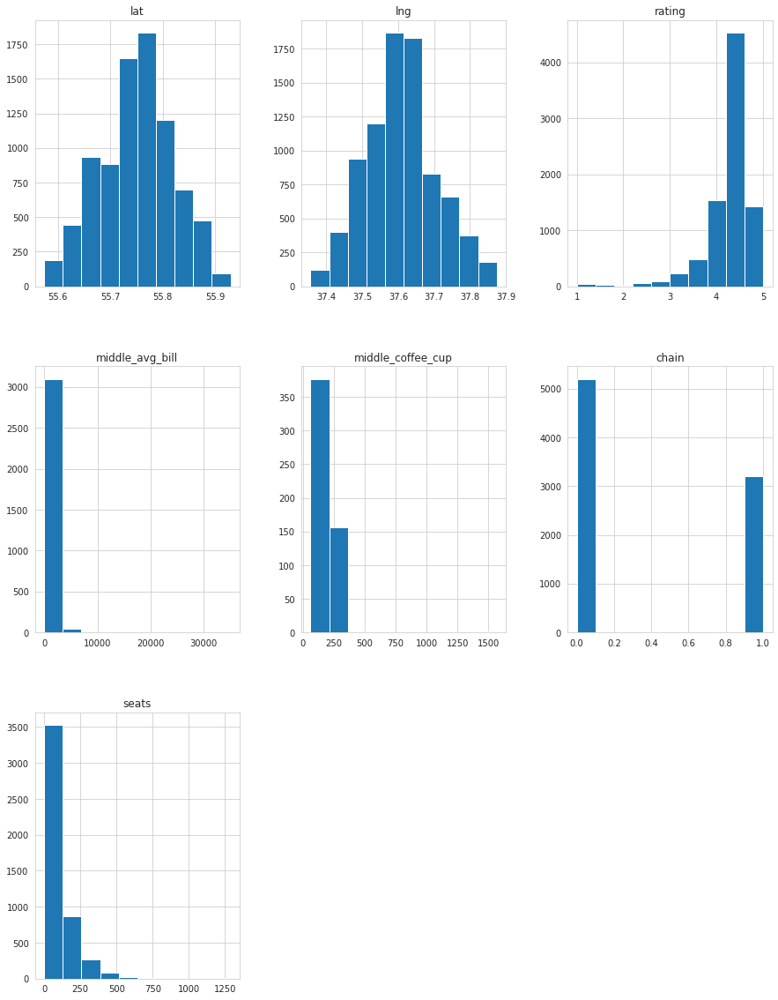

In [6]:
mp.hist(figsize=(15,20))
plt.show()

В датасете представлено 13 столбцов с информацией о заведениях общественного питания Москвы по округам, категориям заведений, часам работы, географическими координатами, рейтингу, средним ценам, принадлежности к сетям, кол-ву посадочных мест.  
Итого 14 столбцов и 8406 строк, в некоторых столбцах присутствуют пропуски.  
Описательная статистика показывает, что в числовых столбцах могут находиться выбросы, с которыми нужно разобраться.
Помимо этого, для удобства необходимо заменить значения в столбце chain на более понятные.

## Предобработка данных

### Пропуски и аномальные значения

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


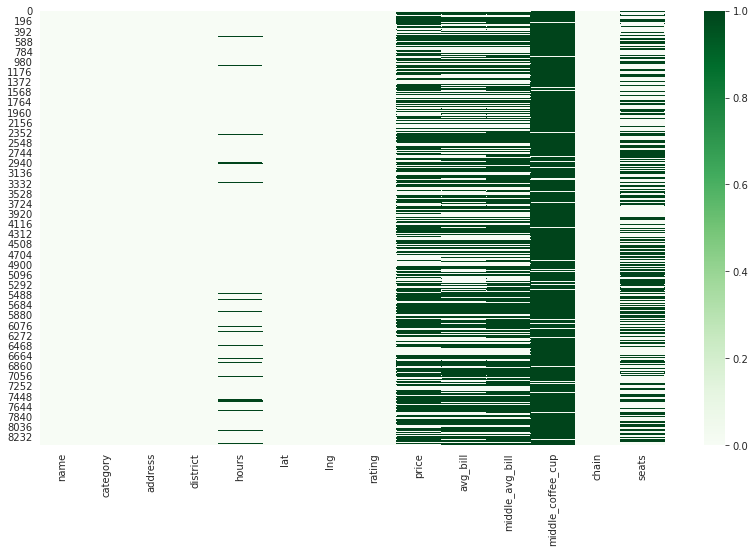

In [7]:
print(mp.isna().sum())
plt.figure(figsize=(14,8))
sns.heatmap(data=mp.isna(), cmap='Greens')
plt.show()

Посчитаем долю пропусков

In [8]:
mp.isna().mean() * 100

name                 0.00
category             0.00
address              0.00
district             0.00
hours                6.38
lat                  0.00
lng                  0.00
rating               0.00
price               60.56
avg_bill            54.60
middle_avg_bill     62.54
middle_coffee_cup   93.64
chain                0.00
seats               42.96
dtype: float64

Больше всего пропусков в столбце middle_coffee_cup

В столбце hours, price, avg_bill заменим пропуски на ND (not defined), поскольку в этих столбцах данные представлены в формате object.

In [9]:
mp['hours'] = mp['hours'].fillna('ND')

In [10]:
mp['price'].value_counts()

средние          2117
выше среднего     564
высокие           478
низкие            156
Name: price, dtype: int64

In [11]:
mp['price'] = mp['price'].fillna('ND')

In [12]:
mp['avg_bill'].value_counts()

Средний счёт:1000–1500 ₽         241
Средний счёт:1500–2000 ₽         120
Средний счёт:300–500 ₽            90
Средний счёт:500–1000 ₽           78
Средний счёт:1500–2500 ₽          68
                                ... 
Средний счёт:291 ₽                 1
Цена бокала пива:160–499 ₽         1
Цена бокала пива:230 ₽             1
Цена чашки капучино:150–245 ₽      1
Средний счёт:200–270 ₽             1
Name: avg_bill, Length: 897, dtype: int64

In [13]:
mp['avg_bill'] = mp['avg_bill'].fillna('ND')

In [14]:
mp['seats'].value_counts()

40.00     253
100.00    213
60.00     175
50.00     168
80.00     160
         ... 
600.00      1
268.00      1
61.00       1
236.00      1
33.00       1
Name: seats, Length: 229, dtype: int64

In [15]:
mp['seats'].describe()

count   4795.00
mean     108.42
std      122.83
min        0.00
25%       40.00
50%       75.00
75%      140.00
max     1288.00
Name: seats, dtype: float64

In [16]:
mp.loc[mp['seats'] == 0]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
84,Meat Doner Kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.90,37.61,4.50,ND,Средний счёт:300 ₽,300.00,NaN,0,0.00
177,Арамье,булочная,"Москва, улица 800-летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.88,37.56,4.00,ND,ND,NaN,NaN,1,0.00
196,Донер-Шашлык,ресторан,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.90,37.61,4.50,ND,ND,NaN,NaN,0,0.00
203,Тандыр № 1,кафе,"Москва, улица Лескова, 22Г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.90,37.61,4.00,ND,ND,NaN,NaN,1,0.00
211,Неаполитан пицца,кафе,"Москва, улица Пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.89,37.60,4.30,ND,ND,NaN,NaN,0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8118,Бико,булочная,"Москва, улица Симоновский Вал, 13, стр. 3",Юго-Восточный административный округ,"ежедневно, 08:00–20:00",55.72,37.66,1.30,ND,ND,NaN,NaN,0,0.00
8168,Чайхана УЧ Кудук,кофейня,"Москва, улица Симоновский Вал, 26, корп. 1",Южный административный округ,"ежедневно, 09:00–00:00",55.72,37.66,4.30,ND,ND,NaN,NaN,0,0.00
8172,Масса кофе,кофейня,"Москва, Холодильный переулок, 2",Южный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–20:00",55.71,37.62,4.30,средние,Цена чашки капучино:100–210 ₽,NaN,155.00,0,0.00
8336,Сочная шаурма в Кузьминках,быстрое питание,"Москва, Волгоградский проспект, 102",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.70,37.77,3.90,ND,Средний счёт:120–130 ₽,125.00,NaN,0,0.00


Места, где нет посадочных мест, могут быть объектами быстрого питания с окнами выдачи продуктов. Их 136, оставим их как есть.

In [17]:
mp.loc[mp['seats'] == mp['seats'].max()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.65,37.48,4.10,высокие,Средний счёт:1500–2000 ₽,1750.00,NaN,0,1288.00
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00–00:00",55.66,37.48,4.50,выше среднего,Средний счёт:1500 ₽,1500.00,NaN,1,1288.00
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.67,37.49,4.80,ND,ND,NaN,NaN,1,1288.00
6641,One Price Coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.67,37.48,4.30,ND,ND,NaN,NaN,1,1288.00
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.67,37.49,4.10,средние,Средний счёт:700 ₽,700.00,NaN,0,1288.00
6684,Пивной ресторан,"бар,паб","Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,ND,55.66,37.48,4.50,ND,ND,NaN,NaN,0,1288.00
6690,Японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,ND,55.66,37.48,4.40,ND,ND,NaN,NaN,1,1288.00
6771,Точка,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,ND,55.67,37.48,4.70,ND,ND,NaN,NaN,1,1288.00
6807,Loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.67,37.48,3.60,ND,ND,NaN,NaN,0,1288.00
6808,Яндекс Лавка,ресторан,"Москва, проспект Вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.67,37.51,4.00,ND,ND,NaN,NaN,1,1288.00


Странно, что все самые крупные по посадочным местам заведения расположены на Проспекте Вернадского. Посмотрим, с чем это связано

In [18]:
mp.query('seats > 800')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2713,Ваня и Гоги,"бар,паб","Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 11:00–06:00",55.79,37.75,4.20,высокие,Средний счёт:1000–2500 ₽,1750.00,NaN,0,1040.00
2722,Маргарита,быстрое питание,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 10:00–22:00",55.79,37.75,4.30,ND,ND,NaN,NaN,1,1040.00
2770,Шоколадница,кофейня,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"пн-ср 11:00–23:00; чт 11:00–00:00; пт,сб 11:00–05:00; вс 11:00–23:00",55.79,37.75,4.10,ND,ND,NaN,NaN,1,1040.00
2966,Матрешка,кафе,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,ND,55.79,37.75,4.00,ND,ND,NaN,NaN,0,1040.00
4180,Eataly,"бар,паб","Москва, Киевская улица, 2",Западный административный округ,"ежедневно, 12:00–23:00",55.74,37.56,4.60,ND,ND,NaN,NaN,0,920.00
4231,РестоБар Argomento,столовая,"Москва, Кутузовский проспект, 41, стр. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.74,37.53,4.20,высокие,Средний счёт:2500–5000 ₽,3750.00,NaN,0,1200.00
4245,Стейк & Бургер,кафе,"Москва, Киевская улица, 2",Западный административный округ,"ежедневно, 09:00–21:00",55.74,37.56,4.20,ND,ND,NaN,NaN,1,920.00
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.65,37.48,4.10,высокие,Средний счёт:1500–2000 ₽,1750.00,NaN,0,1288.00
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00–00:00",55.66,37.48,4.50,выше среднего,Средний счёт:1500 ₽,1500.00,NaN,1,1288.00
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.67,37.49,4.80,ND,ND,NaN,NaN,1,1288.00


In [19]:
mp.query('seats > 700').shape[0]

19

Вероятно, такое большое кол-во посадочных мест обусловлено тем фактом, что заведения находятся в одном ТЦ, гастрорынке и пр. подобных местах, поэтому кол-во посадочных мест рассчитано для всего фудкорта. Оставим эти данные как есть.

In [20]:
mp.isna().mean() * 100

name                 0.00
category             0.00
address              0.00
district             0.00
hours                0.00
lat                  0.00
lng                  0.00
rating               0.00
price                0.00
avg_bill             0.00
middle_avg_bill     62.54
middle_coffee_cup   93.64
chain                0.00
seats               42.96
dtype: float64

Посмотрим, можно ли что-то сделать с пропусками в столбце middle_coffee_cup

Судя по всему, в столбце middle_coffee_cup значения присутствуют только там, где в соответстующей строке столбца avg_bill указана цена чашки кофе 

In [21]:
check = mp.query('category == "кофейня" & avg_bill != "ND"')
check

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,ND,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.90,37.57,4.10,средние,Средний счёт:500–800 ₽,650.00,NaN,1,NaN
72,Лакрица,кофейня,"Москва, Алтуфьевское шоссе, 85",Северо-Восточный административный округ,"ежедневно, 08:00–21:00",55.89,37.59,4.50,средние,Цена чашки капучино:150–190 ₽,NaN,170.00,0,12.00
81,Coffee Way,кофейня,"Москва, Алтуфьевское шоссе, 86, корп. 1",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.90,37.59,4.30,ND,Цена чашки капучино:120–170 ₽,NaN,145.00,1,120.00
89,Сахарочек,кофейня,"Москва, Дмитровское шоссе, 107А, корп. 2",Северный административный округ,пн-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00,55.88,37.54,4.50,средние,Цена чашки капучино:100–200 ₽,NaN,150.00,0,120.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8341,Среда Питания,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–20:00; сб,вс 09:00–19:00",55.72,37.72,4.40,средние,Средний счёт:200–400 ₽,300.00,NaN,0,NaN
8342,Coffee Week,кофейня,"Москва, Рязанский проспект, 30, корп. 2",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.72,37.78,4.30,ND,Цена чашки капучино:120–220 ₽,NaN,170.00,0,116.00
8348,Bonjour,кофейня,"Москва, Шоссейная улица, 8",Юго-Восточный административный округ,"пн-пт 07:30–21:00; сб,вс 08:00–21:00",55.69,37.73,4.70,средние,Цена чашки капучино:130–190 ₽,NaN,160.00,0,NaN
8365,Квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.71,37.74,4.20,ND,Цена чашки капучино:100–220 ₽,NaN,160.00,0,206.00


Найдём все строки, где фигурирует слово "чашки".

In [22]:
has_cup = check['avg_bill'].str.contains(pat='чашки')
filtered = check[has_cup]
filtered

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,ND,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
72,Лакрица,кофейня,"Москва, Алтуфьевское шоссе, 85",Северо-Восточный административный округ,"ежедневно, 08:00–21:00",55.89,37.59,4.50,средние,Цена чашки капучино:150–190 ₽,NaN,170.00,0,12.00
81,Coffee Way,кофейня,"Москва, Алтуфьевское шоссе, 86, корп. 1",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.90,37.59,4.30,ND,Цена чашки капучино:120–170 ₽,NaN,145.00,1,120.00
89,Сахарочек,кофейня,"Москва, Дмитровское шоссе, 107А, корп. 2",Северный административный округ,пн-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00,55.88,37.54,4.50,средние,Цена чашки капучино:100–200 ₽,NaN,150.00,0,120.00
100,Take and Wake,кофейня,"Москва, Дмитровское шоссе, 100, стр. 2",Северный административный округ,пн-пт 08:30–18:30,55.88,37.55,4.50,низкие,Цена чашки капучино:150–210 ₽,NaN,180.00,1,120.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8335,Baer Coffee,кофейня,"Москва, Окская улица, 1, корп. 1",Юго-Восточный административный округ,пн 00:00–21:00; вт-сб 09:00–21:00; вс 00:00–21:00,55.71,37.75,4.40,низкие,Цена чашки капучино:120–180 ₽,NaN,150.00,0,80.00
8342,Coffee Week,кофейня,"Москва, Рязанский проспект, 30, корп. 2",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.72,37.78,4.30,ND,Цена чашки капучино:120–220 ₽,NaN,170.00,0,116.00
8348,Bonjour,кофейня,"Москва, Шоссейная улица, 8",Юго-Восточный административный округ,"пн-пт 07:30–21:00; сб,вс 08:00–21:00",55.69,37.73,4.70,средние,Цена чашки капучино:130–190 ₽,NaN,160.00,0,NaN
8365,Квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.71,37.74,4.20,ND,Цена чашки капучино:100–220 ₽,NaN,160.00,0,206.00


Посмотрим, есть ли теперь пропуски в строке middle_coffee_cup

In [23]:
filtered['middle_coffee_cup'].isna().sum()

0

Как видим пропуски отсутствуют. Есть возможность заполнить часть пропусков в данном столбце там, где указана стоимость среднего чека, однако такая оценка будет необъективна, поскольку в средний чек зачастую входит не только исключительно одна чашка кофе.

Оставим пропуски таким образом

Проверим показатель средней стоимости кофе

In [24]:
mp['middle_coffee_cup'].describe(percentiles=[0.25, 0.5, 0.75, 0.95, 0.99])

count    535.00
mean     174.72
std       88.95
min       60.00
25%      124.50
50%      169.00
75%      225.00
95%      275.00
99%      309.90
max     1568.00
Name: middle_coffee_cup, dtype: float64

99% чашек кофе стоит в пределах 309 рублей. Вероятно, всё, что выше, выбросы.

In [25]:
mp.query('middle_coffee_cup > 309')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1769,Шоколадница,кофейня,"Москва, Бутырская улица, 95",Северный административный округ,пн-чт 07:30–23:00; пт 07:30–00:00; сб круглосуточно; вс 00:00–23:00,55.81,37.58,4.10,средние,Цена чашки капучино:300–350 ₽,NaN,325.00,1,61.00
2075,Il Tocco,кофейня,"Москва, Ходынский бульвар, 11А",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–22:00",55.79,37.53,4.10,средние,Цена чашки капучино:280–350 ₽,NaN,315.00,0,NaN
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.78,37.71,4.20,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.00,1,48.00
3718,Кафетериус,кофейня,"Москва, Большая Никитская улица, 35",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.76,37.60,4.30,средние,Цена чашки капучино:279–378 ₽,NaN,328.00,1,30.00
5503,Coffee FM,кофейня,"Москва, Авиамоторная улица, 10, корп. 1",Юго-Восточный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–19:00",55.75,37.72,4.30,ND,Цена чашки капучино:250–500 ₽,NaN,375.00,0,190.00
5990,Диемм,кофейня,"Москва, 3-я Фрунзенская улица, 1",Центральный административный округ,"ежедневно, 08:30–23:00",55.72,37.58,4.30,средние,Цена чашки капучино:250–390 ₽,NaN,320.00,0,30.00


Здесь, вероятно закралась ошибка. Заменим это значение на среднюю стоимость чашки кофе в Шоколаднице.

In [26]:
mp.query('name == "Шоколадница"').groupby('name')['middle_coffee_cup'].agg('mean')[0].round()

277.0

In [27]:
mp.loc[(mp.middle_coffee_cup == 1568), 'middle_coffee_cup'] = (mp.query('name == "Шоколадница"')
                                                               .groupby('name')['middle_coffee_cup']
                                                               .agg('mean')[0].round()
                                                              )

In [28]:
mp.query('middle_coffee_cup > 375')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [29]:
mp.shape[0]

8406

Данные заменились корректно

Посмотрим на адекватность значений в столбце middle_avg_bill

In [30]:
mp['middle_avg_bill'].describe(percentiles=[0.25, 0.5, 0.75, 0.95, 0.99])

count    3149.00
mean      958.05
std      1009.73
min         0.00
25%       375.00
50%       750.00
75%      1250.00
95%      2250.00
99%      3750.00
max     35000.00
Name: middle_avg_bill, dtype: float64

99% распределения попадает в средний чек до 3750 рублей. Посмотрим на более дорогие варианты

In [31]:
mp.query('middle_avg_bill > 3750')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
317,Vоdный,ресторан,"Москва, Ленинградское шоссе, 39, стр. 6",Северный административный округ,"ежедневно, 12:00–00:00",55.83,37.48,4.70,высокие,Средний счёт:4500–5500 ₽,5000.00,NaN,0,286.00
730,Чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.87,37.54,4.40,высокие,Средний счёт:5000–17000 ₽,11000.00,NaN,0,49.00
1125,На мангале,кафе,"Москва, проспект Мира, 119, стр. 503",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.83,37.62,1.00,высокие,Средний счёт:4000–5000 ₽,4500.00,NaN,0,NaN
1432,Il Barolo,ресторан,"Москва, Ленинградский проспект, 63",Северный административный округ,"ежедневно, 09:30–23:00",55.80,37.52,4.20,высокие,Средний счёт:3500–5000 ₽,4250.00,NaN,0,90.00
1765,КрабыКутабы,ресторан,"Москва, Лесная улица, 20, стр. 4",Центральный административный округ,"пн-чт 09:00–00:00; пт,сб 09:00–01:00; вс 09:00–00:00",55.78,37.59,4.70,высокие,Средний счёт:4000–5000 ₽,4500.00,NaN,0,180.00
2795,Крошка Картошка,быстрое питание,"Москва, Щёлковское шоссе, вл75",Восточный административный округ,"ежедневно, 10:00–22:00",55.81,37.80,4.00,высокие,Средний счёт:1000–10000 ₽,5500.00,NaN,1,NaN
3038,Беллини,ресторан,"Москва, Рублёвское шоссе, 28",Западный административный округ,"ежедневно, 12:00–00:00",55.75,37.43,4.30,высокие,Средний счёт:5000–5500 ₽,5250.00,NaN,0,150.00
3396,Марио,ресторан,"Москва, улица Климашкина, 17",Центральный административный округ,"ежедневно, 12:00–00:00",55.77,37.57,4.50,высокие,Средний счёт:7000 ₽,7000.00,NaN,0,100.00
3462,Uhvat,ресторан,"Москва, Рочдельская улица, 15с41",Центральный административный округ,"ежедневно, 12:00–00:00",55.76,37.56,4.70,высокие,Средний счёт:3000–5000 ₽,4000.00,NaN,0,NaN
3476,Маритим,ресторан,"Москва, Малая Грузинская улица, 23, стр. 1",Центральный административный округ,"ежедневно, 11:00–03:00",55.77,37.57,4.30,высокие,Средний счёт:от 5000 ₽,5000.00,NaN,0,187.00


В целом, выпадает только одно значение с расхожим названием "Кафе". Непонятно, чем его можно заменить, поэтому просто удалим его

In [32]:
mp = mp.query('middle_avg_bill != 35000')

In [33]:
mp.shape[0]

8405

Данные заменились корректно

### Добавим столбцы

Создадим столбец **street** с названием улицы без указания города

In [34]:
mp.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,ND,ND,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,ND,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


In [35]:
def make_street(row):
    address = row['address'].split(', ')
    street = address[1]
    return street
    
mp['street'] = mp.apply(make_street, axis = 1)

In [36]:
mp.sample(15)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
7271,Вьет Лотос,быстрое питание,"Москва, Поречная улица, 10",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.65,37.77,4.60,ND,ND,NaN,NaN,0,0.00,Поречная улица
6256,Эксмо,кафе,"Москва, Ленинский проспект, 35",Южный административный округ,ND,55.71,37.59,3.20,ND,ND,NaN,NaN,0,NaN,Ленинский проспект
2191,Масала Хаус,ресторан,"Москва, проспект Мира, 79",Центральный административный округ,"ежедневно, 12:00–23:00",55.79,37.63,4.40,выше среднего,Средний счёт:750–1500 ₽,1125.00,NaN,1,60.00,проспект Мира
3625,Культурный код,кафе,"Москва, улица Чаянова, 12",Центральный административный округ,"ежедневно, 09:00–23:00",55.78,37.60,4.60,ND,ND,NaN,NaN,0,35.00,улица Чаянова
6942,VI Cafe,кофейня,"Москва, Электролитный проезд, 16, корп. 7",Южный административный округ,"ежедневно, 11:00–23:00",55.67,37.61,4.20,средние,Средний счёт:до 1000 ₽,1000.00,NaN,0,20.00,Электролитный проезд
433,Little Panda Cafe,пиццерия,"Москва, улица Мещерякова, 3",Северо-Западный административный округ,"ежедневно, 09:00–21:30",55.83,37.45,4.20,средние,Средний счёт:300–800 ₽,550.00,NaN,0,20.00,улица Мещерякова
2222,Фиалка,ресторан,"Москва, Песочная аллея, 5",Восточный административный округ,вт-вс 12:00–21:00,55.79,37.67,4.00,выше среднего,Средний счёт:от 1200 ₽,1200.00,NaN,0,100.00,Песочная аллея
5876,Яндекс Лавка,ресторан,"Москва, улица Марии Ульяновой, 10",Юго-Западный административный округ,"ежедневно, 07:00–00:00",55.68,37.52,4.00,ND,ND,NaN,NaN,1,NaN,улица Марии Ульяновой
6852,Метехи,кафе,"Москва, улица Обручева, 55А",Юго-Западный административный округ,"ежедневно, 12:00–23:00",55.65,37.56,4.90,выше среднего,Средний счёт:1500 ₽,1500.00,NaN,0,90.00,улица Обручева
4539,Пропаганда,"бар,паб","Москва, Большой Златоустинский переулок, 7, стр. 1",Центральный административный округ,пн 12:00–00:00; вт-вс 12:00–06:00,55.76,37.63,4.40,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,80.00,Большой Златоустинский переулок


Создадим столбец **is_24_7** с круглосуточными заведениями в зависимости от значения в столбце hours

Судя по всему, круглосуточные заведения только те, для которых в столбце hours указано "ежедневно, круглосуточно". Посмотрим, сколько таких строк в датафрейме

In [37]:
has_24_7 = mp['hours'].str.contains(pat='ежедневно, круглосуточно')
mp[has_24_7].shape[0]

729

In [38]:
mp['is_24_7'] = np.where(mp['hours'].str.contains(pat='ежедневно, круглосуточно'), True, False)

In [39]:
mp.sample(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3048,Шоколадница,кофейня,"Москва, Ярцевская улица, 32",Западный административный округ,"пн-пт 07:30–22:00; сб,вс 09:00–22:00",55.74,37.42,4.20,средние,Цена чашки капучино:150–290 ₽,NaN,220.00,1,94.00,Ярцевская улица,False
5224,Prime,ресторан,"Москва, Космодамианская набережная, 52с5",Центральный административный округ,пн-пт 07:30–20:00,55.73,37.64,3.90,низкие,Средний счёт:300 ₽,300.00,NaN,1,NaN,Космодамианская набережная,False
1446,9 Bar Coffee,кофейня,"Москва, Ленинградский проспект, 80, корп. 1",Северный административный округ,"пн-пт 07:30–21:00; сб,вс 07:30–19:00",55.81,37.51,4.30,ND,Цена чашки капучино:60–150 ₽,NaN,105.00,1,625.00,Ленинградский проспект,False
432,Додо Пицца,пиццерия,"Москва, улица Фабрициуса, 22, корп. 1",Северо-Западный административный округ,"ежедневно, 09:00–23:00",55.84,37.44,4.30,ND,Средний счёт:321 ₽,321.00,NaN,1,43.00,улица Фабрициуса,False
7655,Mellman’s coffee,кофейня,"Москва, улица Генерала Тюленева, 4А, стр. 1",Юго-Западный административный округ,"ежедневно, 09:00–21:00",55.63,37.48,4.30,ND,ND,NaN,NaN,0,90.00,улица Генерала Тюленева,False
3097,Шаурма 24,быстрое питание,"Москва, Осенняя улица, 23",Западный административный округ,"ежедневно, 10:00–22:00",55.77,37.40,3.40,ND,Средний счёт:250–500 ₽,375.00,NaN,1,NaN,Осенняя улица,False
6822,Баже,быстрое питание,"Москва, Профсоюзная улица, 126к3",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.63,37.52,1.10,ND,ND,NaN,NaN,0,NaN,Профсоюзная улица,False
6175,От мяса ДО рыбы,ресторан,"Москва, улица Вавилова, 64/1с1",Юго-Западный административный округ,"пн-пт 12:00–00:00; сб,вс 11:00–00:00",55.68,37.55,4.30,ND,ND,NaN,NaN,0,NaN,улица Вавилова,False
5476,Шаш,кафе,"Москва, Авиамоторная улица, 4",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.76,37.72,4.00,ND,Средний счёт:250–500 ₽,375.00,NaN,0,NaN,Авиамоторная улица,True
2687,Лемонграсс,ресторан,"Москва, Мироновская улица, 25",Восточный административный округ,"ежедневно, 11:00–23:00",55.79,37.73,4.30,средние,Средний счёт:от 1000 ₽,1000.00,NaN,0,50.00,Мироновская улица,False


Проверим, совпадает ли кол-во круглосуточных заведений в столбцах hours и is_24_7

In [40]:
mp.query('is_24_7 == True').shape[0]

729

Кол-во строк в столбцах совпадает, создание столбца прошло корректно

Помимо этого, заменим значения в столбце chain

In [41]:
mp['chain'] = mp['chain'].replace({0:'одиночное', 1:'сетевое'})

### Неявные дубликаты 

Проверим, попались ли в датасет одинаковые названия заведений по одному и тому же адресу. Для этого сгруппируем данные по адресу заведений

In [42]:
mp['address'] = mp['address'].str.lower() 
mp['name'] = mp['name'].str.lower() 

In [43]:
mp.groupby(['address', 'name'])['name'].nunique().sort_values(ascending=False)

address                              name                  
москва, 1-й автозаводский проезд, 5  чайхана азия              1
москва, сходненская улица, 56        франклинс бургер          1
                                     сходненская56             1
                                     вкинобар                  1
                                     vasilchukí chaihona №1    1
                                                              ..
москва, ленинский проспект, 75а      остерия альберобелло      1
москва, ленинский проспект, 75/9     ломоносов                 1
москва, ленинский проспект, 74       сёкуёку                   1
москва, ленинский проспект, 73/8     ниппон кафе               1
москва, № 7                          енот                      1
Name: name, Length: 8401, dtype: int64

Неявные дубликаты с одинаковым названием и адресом отсутствуют

## Анализ данных

### Категории заведений

In [44]:
mp.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,ND,ND,NaN,NaN,одиночное,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,одиночное,4.00,улица Дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,одиночное,45.00,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,ND,Цена чашки капучино:155–185 ₽,NaN,170.00,одиночное,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,сетевое,148.00,Правобережная улица,False


In [45]:
name_by_categories = mp.groupby('category')['name'].agg('count').sort_values(ascending=False).reset_index()
name_by_categories

,category,name
0,кафе,2378
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [46]:
names = np.array(name_by_categories['category'])
values = np.array(name_by_categories['name'])
fig = px.pie(names=names, values=values, title='Распределение заведений по категориям')
fig.update_layout(title_x=0.45)
fig.show()

In [47]:
fig = px.bar(name_by_categories, y='category', x='name', title='Количество заведений по категориям', text='name')
fig.update_layout(
                 yaxis_title='Категория',
                 xaxis_title='Кол-во заведений',
                 title_x=0.5
                 )
fig.update_xaxes(tickangle=45)
fig.show()

<div class="alert alert-block alert-success">
    
<b>Комментарий ревьюера:</b> Молодец, что подписываешь значения в столбцах.
</div>

**Вывод:**  
В датафрейме представлены следующие категории заведений: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая, булочная.  
БОльшая часть заведений представлена кафе (28.3%) и ресторанами (24.3%), меньше всего - столовых (3.75%) и булочных (3.05%).

### Посадочные места по категориям заведений

Посмотрим на среднее и медианное кол-во посадочных мест в заведении по категориям

In [48]:
seats_by_categories = mp.groupby('category')['seats'].agg({'mean', 'median'}).sort_values(by='mean', ascending=False).reset_index()
seats_by_categories

,category,median,mean
0,"бар,паб",82.50,124.53
1,ресторан,86.00,121.96
2,кофейня,80.00,111.20
3,столовая,75.50,99.75
4,быстрое питание,65.00,98.89
5,кафе,60.00,97.51
6,пиццерия,55.00,94.50
7,булочная,50.00,89.39


In [49]:
mp['seats'].describe(percentiles=[0.05,0.25,0.5,0.75,0.95,0.99])

count   4794.00
mean     108.42
std      122.85
min        0.00
5%         6.00
25%       40.00
50%       75.00
75%      140.00
95%      307.00
99%      625.00
max     1288.00
Name: seats, dtype: float64

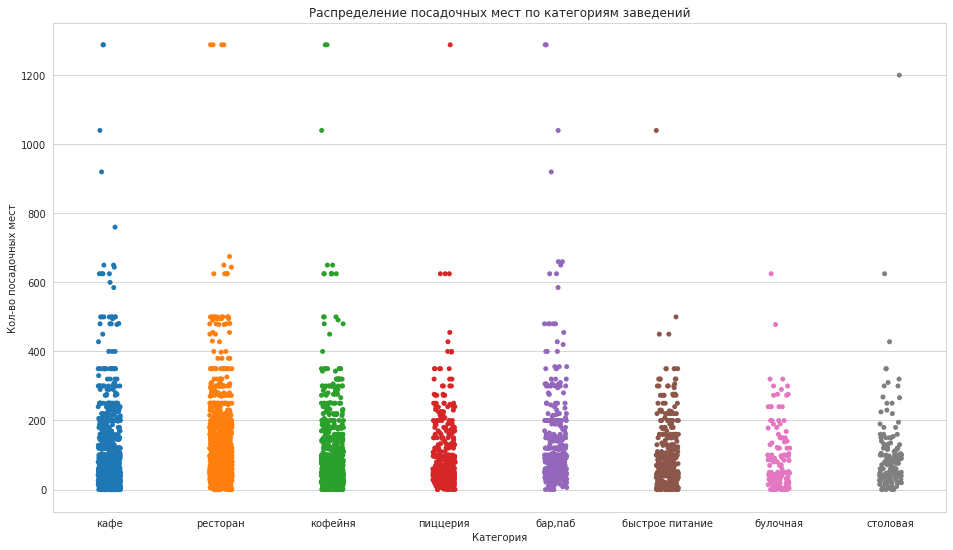

In [50]:
plt.figure(figsize=(16,9))
sns.stripplot(data=mp, x='category', y='seats')
plt.title('Распределение посадочных мест по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Кол-во посадочных мест')
plt.show()

Построим такой же график для основного распределения (95%)

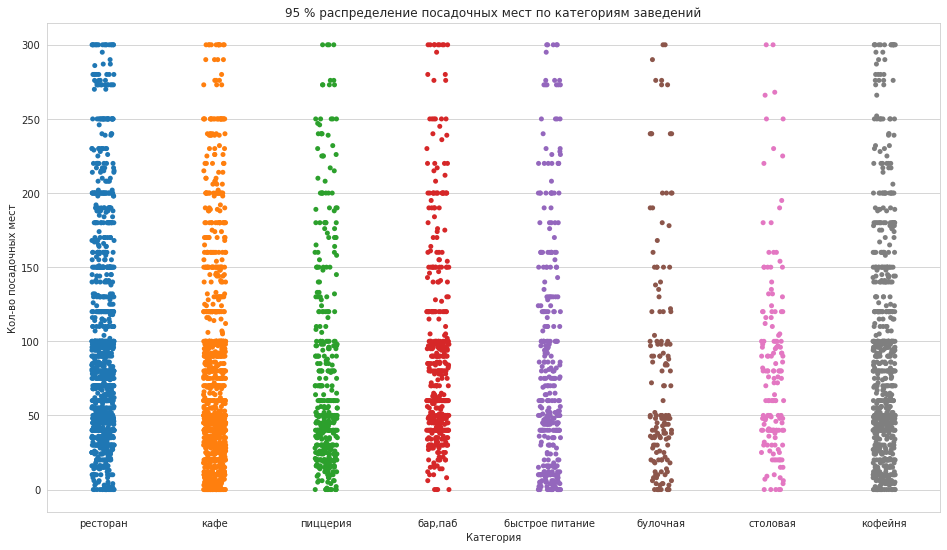

In [51]:
plt.figure(figsize=(16,9))
sns.stripplot(data=mp.query('seats <= 300'), x='category', y='seats')
plt.title('95 % распределение посадочных мест по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Кол-во посадочных мест')
plt.show()

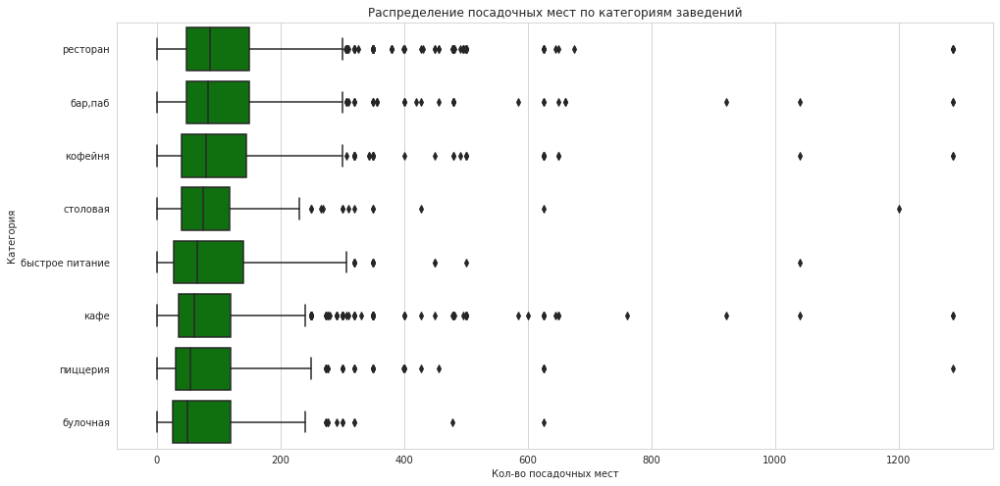

In [52]:
# доп. переменная для сортировки на графике
order = mp.groupby(by=["category"])["seats"].median().sort_values().iloc[::-1].index

plt.figure(figsize=(16,8))
sns.boxplot(data=mp, y='category', x='seats', order=order, color='green')
plt.title('Распределение посадочных мест по категориям заведений')
plt.ylabel('Категория')
plt.xlabel('Кол-во посадочных мест')
plt.show()

**Вывод:**  
По медиане меньше всего посадочных мест в булочных (52 места) и в пиццериях (55 мест), а больше всего в ресторанах (90 мест) и в барах/пабах (82 места).
Среди типов заведений по кол-ву посадочных мест выделяются рестораны и кафе: для них характерно бОльшее кол-во посадочных мест, чем для других типов заведений.  
Чаще всего в заведениях встречается до 100 посадочных мест.  
По межквартильному размаху больше всего посадочных мест также у ресторанов и баров\пабов.  
Свыше 300-х посадочных мест чаще встречается у кафе и ресторанов.

### Соотношение сетевых и несетевых заведений

In [53]:
cnt_by_chain = mp.groupby('chain')['name'].agg('count').sort_values(ascending=False).reset_index()
cnt_by_chain

,chain,name
0,одиночное,5200
1,сетевое,3205


In [54]:
fig = px.pie(names=cnt_by_chain['chain'], values=cnt_by_chain['name'], title='Соотношение сетевых и несетевых заведений')
fig.update_layout(title_x = 0.5)
fig.show()

Сетевых заведений среди представленных в анализе - 38.1%, несетевых - 61.9%

Проверим, сходятся ли цифры

In [55]:
mp.query('chain == "сетевое"').shape[0]

3205

In [56]:
categories_by_chain = mp.pivot_table(index='category', columns='chain', values='name', aggfunc='count')
categories_by_chain['ratio'] = ((categories_by_chain['сетевое']/
                                (categories_by_chain['сетевое'] + categories_by_chain['одиночное']) * 100).round(1)
                               )
categories_by_chain = categories_by_chain.reset_index().sort_values(by='ratio', ascending=False)
categories_by_chain

chain,category,одиночное,сетевое,ratio
1,булочная,99,157,61.30
5,пиццерия,303,330,52.10
4,кофейня,693,720,51.00
2,быстрое питание,371,232,38.50
6,ресторан,1312,730,35.70
3,кафе,1599,779,32.80
7,столовая,227,88,27.90
0,"бар,паб",596,169,22.10


In [57]:
fig = px.bar(categories_by_chain, x='category', y='ratio', text='ratio', 
             title='Доля сетевых заведений среди категорий общепита')
fig.update_layout(xaxis_title='Категория', yaxis_title='Доля сетевых заведений', title_x = 0.5)
fig.show()

In [58]:
chain_size = mp.query('chain == "сетевое"').groupby('name')['name'].agg('count')
chain_size.describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95, 0.99])

count   747.00
mean      4.29
std       8.53
min       1.00
5%        1.00
25%       2.00
50%       2.00
75%       3.00
95%      13.70
99%      43.08
max     120.00
Name: name, dtype: float64

**Вывод:**  
Сетевых заведений - 38.1%, несетевых - 61.9%.  
Среди булочных, кофеен и пиццерий сетевых заведений больше, чем несетевых.  
Наименее "сетевыми" заведениями являются столовые и бары\пабы.  
Более, чем в половине сетей, всего 2 заведения. 95% сетей располагают до 42 заведений.

### Топ-15 сетей по популярности (по кол-ву заведений сети в Москве)

In [59]:
mp.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,ND,ND,NaN,NaN,одиночное,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,одиночное,4.00,улица Дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,одиночное,45.00,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,ND,Цена чашки капучино:155–185 ₽,NaN,170.00,одиночное,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,сетевое,148.00,Правобережная улица,False


In [60]:
top_15 = (mp.query('chain == "сетевое"')
          .groupby('name')[['category', 'name']]
          .agg({'category':'first', 'name':'count'})
          .rename_axis(index={"name": "catering_name"})
          .sort_values(by='name', ascending=False)
          .reset_index()
          .rename(columns={'name':'count'})
          .head(15)
         )
top_15

,catering_name,category,count
0,шоколадница,кофейня,120
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,50
7,хинкальная,быстрое питание,44
8,кофепорт,кофейня,42
9,кулинарная лавка братьев караваевых,кафе,39


In [61]:
fig = px.bar(top_15, title='Топ-15 сетей в Москве по количеству заведений',
             x='catering_name', y='count',
             text = 'count'
            )
fig.update_layout(title_x=0.5,
                 xaxis_title='Название заведения',
                 yaxis_title='Количество',
                 showlegend=False)
fig.show()

Посмотрим, к каким категориям относятся заведения из топ-15

In [62]:
fig = px.sunburst(top_15, 
                 path = ['category', 'catering_name'], values='count',
                 width=700, height=700,
                 title='Распределение заведений по категории по округам Москвы')
fig.update_traces(textinfo="label")
fig.update_layout(title_x = 0.5, font=dict(size=14))
fig.show()

In [63]:
fig = px.bar(
             top_15.groupby('category')['catering_name'].agg('count').sort_values(ascending=False),
             title='Распределение категорий среди топ-15 сетей по количеству заведений',
             text=top_15.groupby('category')['catering_name'].agg('count').sort_values(ascending=False)
            )
fig.update_layout(title_x = 0.5,
                  xaxis_title='Категория',
                  yaxis_title='Количество',
                  showlegend=False,
                 )
fig.show()

**Вывод:**  
Cамой крупной сетью является "Шоколадница" со 120 заведениями в Москве.  
Наименее крупной сетью среди топ-15 в Москве является "Му-Му" с 27 заведениями.  
**В топ-15 сетей попали 5 кофеен, по 3 ресторана и кафе, 2 пиццерии, 1 булочная и 1 быстрое питание.**
**Больше всего заведений среди топ-15 сетей (по популярности) относится к кофейням (337).**

In [64]:
(
 mp.query('name in @top_15.catering_name')
    .groupby('category')['name']
    .agg('count')
    .sort_values(ascending=False)
    .reset_index()
)

,category,name
0,кофейня,337
1,ресторан,186
2,пиццерия,152
3,кафе,100
4,булочная,25
5,быстрое питание,12
6,"бар,паб",4
7,столовая,2


In [65]:
fig = px.bar(
             (
               mp.query('name in @top_15.catering_name')
               .groupby('category')['name']
               .agg('count')
               .sort_values(ascending=False)
               .reset_index()
             ),
             title='Распределение заведений топ-15 сетей по категориям',
             x='category', y='name', text='name'
            )
fig.update_layout(title_x = 0.5,
                  xaxis_title='Категория',
                  yaxis_title='Количество',
                  showlegend=False,
                 )
fig.show()

### Заведения по округам

In [66]:
mp.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,ND,ND,NaN,NaN,одиночное,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,1550.00,NaN,одиночное,4.00,улица Дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,1000.00,NaN,одиночное,45.00,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,ND,Цена чашки капучино:155–185 ₽,NaN,170.00,одиночное,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,сетевое,148.00,Правобережная улица,False


In [67]:
mp.groupby('district')['name'].agg('count').sort_values(ascending=False).reset_index().rename(columns={'name':'count'})

,district,count
0,Центральный административный округ,2242
1,Северный административный округ,900
2,Северо-Восточный административный округ,891
3,Южный административный округ,891
4,Западный административный округ,851
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


Больше всего заведений представлено в ЦАО (2242 шт.), меньше всего в СЗАО (409 шт.) 

Отобразим кол-во заведений по районам по типу заведения

In [68]:
fig = px.bar(mp.groupby(['district', 'category'])[['category', 'name']]
             .agg({'name':'count'})
             .reset_index()
             .sort_values(by='name'),
             x="district",
             y='name',
             color="category",
             #text='name',
             title='Распределение заведений по категории по округам Москвы',
             color_discrete_sequence=px.colors.qualitative.Prism
            )
fig.update_layout(height=800, width=1100, title_x = 0.5,
                  xaxis_title='Округ',
                  yaxis_title='Количество',
                  xaxis = {"categoryorder":"total ascending"},
                  legend_title_text='Категория'
                 )
fig.show()

In [69]:
fig = px.sunburst(mp, 
                 path = ['district', 'category'],
                 width=1000, height=1000,
                 title='Распределение заведений по категории по округам Москвы')
fig.update_traces(textinfo="label+percent parent")
fig.update_layout(title_x = 0.5, font=dict(size=20))
fig.show()

**Вывод:**  
Больше всего заведений представлено в ЦАО (2242 шт.), меньше всего в СЗАО (409 шт.)   
По всем округам меньше всего среди заведений представлено булочных.  
В ЦАО преобладают рестораны, во всех остальных округах преобладают кафе.  
В процентном соотношении кофейни чаще всего (в 21%) случаев встречаются в САО.

### Рейтинги по категориям заведений

In [70]:
rating_by_category = mp.groupby('category')['rating'].agg('mean').sort_values(ascending=False).reset_index()
rating_by_category

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [71]:
fig = px.bar(rating_by_category, x='category', y='rating', text = rating_by_category['rating'].round(2),
             title='Распределение среднего рейтинга заведений по категории',
             range_y = (4, 4.4)
            )
fig.update_layout(title_x=0.5,
                 xaxis_title='Категория заведения',
                 yaxis_title='Рейтинг',
                 showlegend=False)
fig.show()

Наивысший средний рейтинг принадлежит барам и пабам (4.39). Наименьший - заведениям быстрого питания (4.05). Рейтинги заведений при этом отличаются незначительно.

Посмотрим, как отличаются усредненные рейтинги по категории заведения по районам

In [72]:
rating_by_district = mp.pivot_table(index='district', columns='category', values='rating', aggfunc='mean')
rating_by_district

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,4.32,4.17,4.04,4.10,4.28,4.27,4.19,4.23
Западный административный округ,4.40,4.26,3.97,4.08,4.20,4.29,4.26,4.11
Северный административный округ,4.33,4.25,3.98,4.18,4.29,4.29,4.29,4.22
Северо-Восточный административный округ,4.19,4.34,4.03,4.05,4.22,4.26,4.21,4.08
Северо-Западный административный округ,4.39,4.28,3.95,4.05,4.33,4.34,4.29,4.19
Центральный административный округ,4.49,4.37,4.23,4.30,4.34,4.41,4.42,4.32
Юго-Восточный административный округ,4.20,4.04,3.93,4.05,4.23,4.19,4.16,4.10
Юго-Западный административный округ,4.35,4.16,4.09,4.04,4.28,4.34,4.23,4.24
Южный административный округ,4.28,4.34,4.10,4.09,4.23,4.26,4.21,4.26


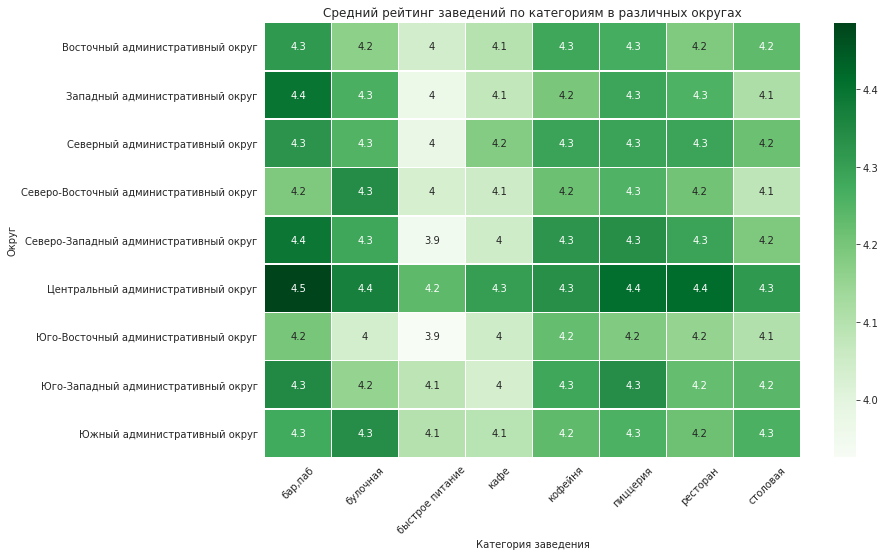

In [73]:
plt.figure(figsize=(12,8))
sns.heatmap(data=rating_by_district, annot=True, cmap='Greens', linewidth=.5)
plt.ylabel('Округ')
plt.xlabel('Категория заведения')
plt.title('Средний рейтинг заведений по категориям в различных округах')
plt.xticks(rotation=45)
plt.show()

**Вывод:**  
Наивысший средний рейтинг принадлежит барам и пабам (4.4). Наименьший - заведениям быстрого питания (4.05). Рейтинги заведений при этом отличаются незначительно.  
По графику обычно самыми низкорейтинговыми являются заведения быстрого питания. Однако, в ЮЗАО и ЮАО худший рейтинг среди категорий показывают рестораны. При этом, лучшие по рейтингу заведения (по каждой категории) находятся в ЦАО. В среднем, лучшие оценки по всем округам показывают бары\пабы.

### Хороплет

In [74]:
mp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8405 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8405 non-null   object 
 1   category           8405 non-null   object 
 2   address            8405 non-null   object 
 3   district           8405 non-null   object 
 4   hours              8405 non-null   object 
 5   lat                8405 non-null   float64
 6   lng                8405 non-null   float64
 7   rating             8405 non-null   float64
 8   price              8405 non-null   object 
 9   avg_bill           8405 non-null   object 
 10  middle_avg_bill    3148 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8405 non-null   object 
 13  seats              4794 non-null   float64
 14  street             8405 non-null   object 
 15  is_24_7            8405 non-null   bool   
dtypes: bool(1), float64(6), 

In [75]:
rating_mp = mp.groupby('district')['rating'].mean().sort_values(ascending=False).reset_index()
rating_mp

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Южный административный округ,4.18
4,Западный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [76]:
m = Map(location=[55.751244, 37.618423])

In [77]:
pth1 = 'C://Users/drweb/Downloads/admin_level_geomap.geojson'
pth2 = '/datasets/admin_level_geomap.geojson'

Choropleth(
    geo_data = pth2,
    data=rating_mp,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color = 'YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам'
    ).add_to(m)
    
m

Наивысший средний рейтинг заведений представлен в ЦАО (4.38), наименьший - в ЮВАО (4.1).

### Заведения на карте по кластерам

In [78]:
m = Map(location=[55.751244, 37.618423])

In [79]:
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=row['name'],
    ).add_to(marker_cluster)
    
mp.apply(create_clusters, axis=1)
m

Наибольшая концентрация заведений наблюдается в ЦАО

### Топ-15 улиц по количеству заведений

In [80]:
top_15_streets = mp.groupby('street')['name'].count().sort_values(ascending=False).reset_index().head(15)
top_15_streets

,street,name
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Варшавское шоссе,76
7,Каширское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


Построим график распределения заведения по категориям по топ-15 улицам Москвы (по кол-ву заведений)

In [81]:
# датафрейм для отображения объектов по топ-15 улиц
srez = np.array(top_15_streets['street'])
sunburst_df = mp.query('street in @srez')

In [82]:
fig = px.bar(sunburst_df.groupby(['street', 'category'])[['street', 'name']]
             .agg({'name':'count'})
             .reset_index()
             .sort_values(by='name'),
             x="street",
             y='name',
             color="category",
             #text='name',
             title='Распределение заведений по категории по топ-15 улицам Москвы',
             color_discrete_sequence=px.colors.qualitative.Prism
            )
fig.update_layout(height=800, width=1100, title_x = 0.5,
                  xaxis_title='Округ',
                  yaxis_title='Количество',
                  xaxis = {"categoryorder":"total ascending"},
                  legend_title_text='Категория'
                 )
fig.show()

In [83]:
fig = px.sunburst(sunburst_df, 
                 path = ['street', 'category'],
                 width=1000, height=1000,
                 title='Распределение заведений по категории по улицам Москвы')
fig.update_layout(title_x=0.5, font=dict(size=20))
fig.update_traces(textinfo="label+percent parent")
fig.show()

In [84]:
mo = Map(location=[55.751244, 37.618423], zoom_start=10, tiles='Cartodb Positron')
marker_clusters = MarkerCluster().add_to(mo)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_clusters)
mp.query('street in @srez').apply(create_clusters, axis=1)

mo

Так расположены заведения на топ-15 улицах по количеству заведений

Посмотрим, в каких округах больше всего улиц из топ-15

In [85]:
sunburst_df.groupby('district')['street'].agg('nunique').sort_values(ascending=False).reset_index()

,district,street
0,Юго-Западный административный округ,6
1,Южный административный округ,5
2,Западный административный округ,4
3,Северный административный округ,4
4,Северо-Восточный административный округ,3
5,Центральный административный округ,3
6,Юго-Восточный административный округ,2
7,Восточный административный округ,1
8,Северо-Западный административный округ,1


Больше всего улиц из топ-15 по количеству заведений находится в ЮЗАО, меньше всего - в СЗАО. В ЦАО всего 3 таких улицы.

count    774.00
mean     163.55
std      192.89
min        0.00
5%        18.00
25%       50.00
50%       98.00
75%      200.00
95%      495.00
99%     1288.00
max     1288.00
Name: seats, dtype: float64

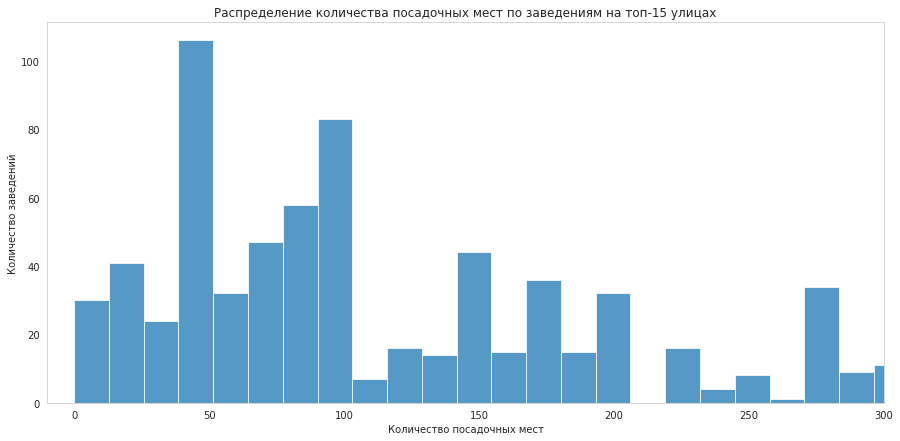

In [86]:
display(mp.query('street in @srez')['seats'].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95, 0.99]))

plt.figure(figsize = (15, 7))
sns.histplot(mp.query('street in @srez')['seats'], bins=100)
plt.xlabel('Количество посадочных мест')
plt.grid()
plt.xlim(-10, 300)
plt.ylabel('Количество заведений')
plt.title('Распределение количества посадочных мест по заведениям на топ-15 улицах')
plt.show()

In [87]:
mp.query('street in @srez').groupby('street')['seats'].median().sort_values(ascending=False)

street
проспект Мира            200.00
Пятницкая улица          150.00
Каширское шоссе          135.00
Дмитровское шоссе        120.00
проспект Вернадского     100.00
улица Вавилова            99.00
Варшавское шоссе          98.00
Ленинградский проспект    98.00
Ленинградское шоссе       96.00
Ленинский проспект        96.00
Кутузовский проспект      92.00
Профсоюзная улица         86.00
улица Миклухо-Маклая      65.00
Люблинская улица          58.00
МКАД                        NaN
Name: seats, dtype: float64

Наибольшее медианное кол-во посадочных мест по улицам принадлежит проспекту Мира (200 мест), наименьшее - у Люблинской улицы (58 мест).

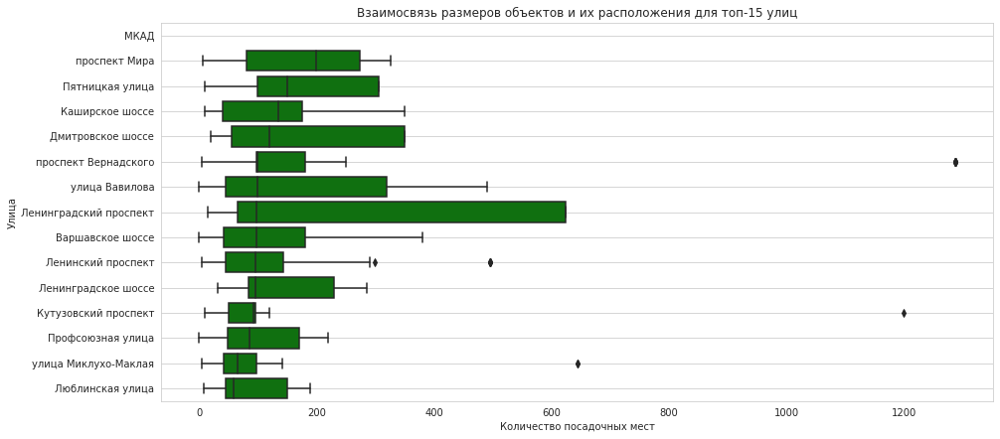

In [88]:
# доп. переменная для сортировки на графике
order = mp.query('street in @srez').groupby(by=["street"])["seats"].median().sort_values().iloc[::-1].index

plt.figure(figsize=(15, 7))
sns.boxplot(x='seats', y='street', data=mp.query('street in @srez'), order=order, color='green') 
plt.xlabel('Количество посадочных мест')
plt.ylabel('Улица')
#plt.xlim(0, 800)
plt.grid()
plt.title('Взаимосвязь размеров объектов и их расположения для топ-15 улиц')
plt.show()

**Вывод:**  
- Больше всего заведений из топ-15 улиц по количеству заведений на проспекте Мира (184), меньше всего - на Пятницкой улице (48).
- Больше всего улиц из топ-15 по количеству заведений находится в ЮЗАО (6), меньше всего - в СЗАО(1). В ЦАО всего 3 таких улицы.
- В среднем на этих улицах 163 посадочных места, по медиане - 98. 95% заведений на этих улицах содержат до 495 посадочных мест.
- Наибольшее медианное кол-во посадочных мест по улицам принадлежит проспекту Мира (200 мест), наименьшее - у Люблинской улицы (58 мест).

### Улицы с одним объектом общепита

Для начала узнаем, сколько всего в датасете улиц

In [89]:
mp['street'].nunique()

1448

In [90]:
one_object = mp.groupby('street')['name'].count().reset_index().query('name == 1')
display(one_object)

# список улиц с одним объектом общепита
one_object_streets = np.array(one_object.street)

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


In [91]:
filtered_streets = mp.query('street in @one_object_streets')
filtered_streets.head()
filtered_streets.shape

(458, 16)

In [92]:
print(f"Улиц с одним заведением {round(filtered_streets.shape[0]/mp['street'].nunique()*100)}% от общего количества")

Улиц с одним заведением 32% от общего количества


In [93]:
filtered_streets.groupby('district')['street'].count().sort_values(ascending=False)

district
Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: street, dtype: int64

In [94]:
filtered_streets.groupby('category')['street'].count().sort_values(ascending=False)

category
кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: street, dtype: int64

In [95]:
fig = px.bar(filtered_streets.groupby(['district', 'category'])[['category', 'name']]
             .agg({'name':'count'})
             .reset_index()
             .sort_values(by='name'),
             x="district",
             y='name',
             color="category",
             #text='name',
             title='Распределение заведений по категории по округам Москвы с одним заведением на улице',
             color_discrete_sequence=px.colors.qualitative.Prism
            )
fig.update_layout(height=800, width=1100, title_x = 0.5,
                  xaxis_title='Округ',
                  yaxis_title='Количество',
                  xaxis = {"categoryorder":"total ascending"},
                  legend_title_text='Категория'
                 )
fig.show()

In [96]:
fig = px.sunburst(filtered_streets, 
                 path = ['district', 'category'],
                 width=1000, height=1000,
                 title='Распределение заведений по категории по округам Москвы с одним заведением на улице')
fig.update_layout(title_x=0.5)
fig.update_traces(textinfo="label+percent parent")
fig.show()

Самое распространённое заведение по улицам с одним заведением во всех округах является кафе.  
Больше всего улиц с одним заведением находится в ЦАО (145), меньше всего в ЮЗАО (18).

### Исследование средних чеков

In [97]:
avg_bill_mp = mp.groupby('district')['middle_avg_bill'].agg('median').sort_values(ascending=False).reset_index()
avg_bill_mp

,district,middle_avg_bill
0,Западный административный округ,1000.00
1,Центральный административный округ,1000.00
2,Северо-Западный административный округ,700.00
3,Северный административный округ,650.00
4,Юго-Западный административный округ,600.00
5,Восточный административный округ,575.00
6,Северо-Восточный административный округ,500.00
7,Южный административный округ,500.00
8,Юго-Восточный административный округ,450.00


In [98]:
mos = Map(location=[55.751244, 37.618423])

In [99]:
pth1 = 'C://Users/drweb/Downloads/admin_level_geomap.geojson'
pth2 = '/datasets/admin_level_geomap.geojson'

Choropleth(
    geo_data = pth2,
    data=avg_bill_mp,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color = 'Reds',
    fill_opacity=0.8,
    legend_name='Средний чек по округам'
    ).add_to(mos)
    
mos

Самые дорогие заведения находятся в ЦАО и СЗАО, самые дешевые - в СВАО, ЮАО и ЮВАО

Посмотрим на распределение средних чеков по категория заведений в различных округах

In [100]:
avg_bill_by_district = mp.pivot_table(index='district', columns='category', values='middle_avg_bill', aggfunc='mean')
avg_bill_by_district

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,1209.04,263.89,831.73,607.94,486.11,700.73,1221.46,364.70
Западный административный округ,1305.56,723.12,432.33,826.84,694.44,905.07,1478.23,565.00
Северный административный округ,1572.81,625.00,327.13,723.82,495.74,722.62,1312.78,337.50
Северо-Восточный административный округ,986.91,515.71,435.66,673.70,433.16,579.46,1024.57,325.24
Северо-Западный административный округ,1057.14,200.00,295.00,797.97,440.64,682.58,1235.83,298.64
Центральный административный округ,1479.74,1237.92,532.08,765.18,794.76,1104.84,1561.06,319.89
Юго-Восточный административный округ,1043.18,375.00,479.14,589.21,263.00,561.60,931.63,288.93
Юго-Западный административный округ,995.53,556.67,411.32,594.66,381.82,786.66,1117.36,311.67
Южный административный округ,1079.11,458.33,376.92,696.53,504.78,662.93,1015.73,291.39


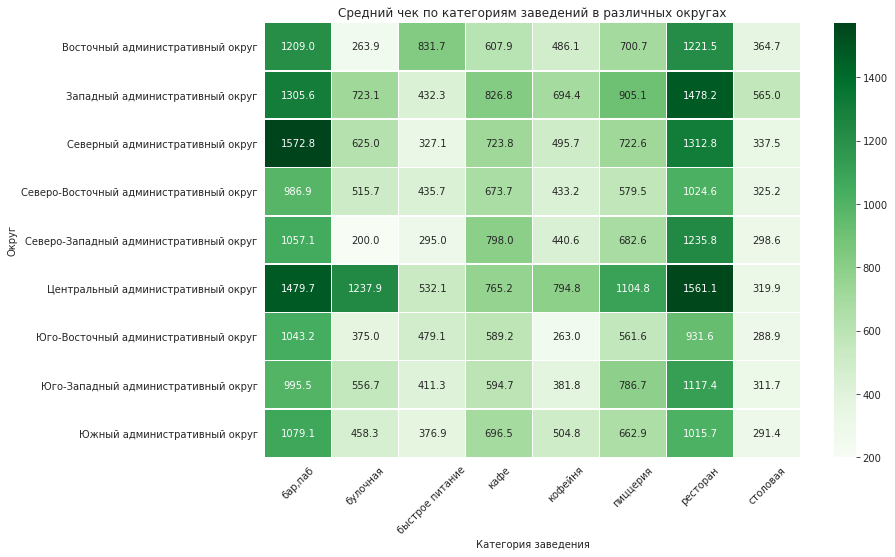

In [101]:
plt.figure(figsize=(12,8))
sns.heatmap(data=avg_bill_by_district, annot=True, cmap='Greens', linewidth=.5, fmt=".1f")
plt.ylabel('Округ')
plt.xlabel('Категория заведения')
plt.title('Средний чек по категориям заведений в различных округах')
plt.xticks(rotation=45)
plt.show()

**Вывод:**  
Самые дорогие заведения находятся в ЦАО и СЗАО, самые дешевые - в СВАО, ЮАО и ЮВАО
Самые дорогие категории заведений - рестораны и бары\пабы, самые дешевые - столовые и быстрое питание.  
ЦАО и ЗАО - самые дорогие округа.  
Чем дальше от центра, тем ниже становятся средние чеки в заведениях (за исключением ЗАО).

### ПРОМЕЖУТОЧНЫЙ ВЫВОД


1) Категории заведений:
- В датафрейме представлены следующие категории заведений: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая, булочная.  
- БОльшая часть заведений представлена кафе (28.3%) и ресторанами (24.3%), меньше всего - столовых (3.75%) и булочных (3.05%).

2) Посадочные места по категории:
- По медиане меньше всего посадочных мест в булочных (52 места) и в пиццериях (55 мест), а больше всего в ресторанах (90 мест) и в барах/пабах (82 места).
- Среди типов заведений по кол-ву посадочных мест выделяются рестораны и кафе: для них характерно бОльшее кол-во посадочных мест, чем для других типов заведений.  
- Свыше 300-х посадочных мест чаще встречается у кафе и ресторанов.

3) Соотношение сетевые и несетевых заведений:
- Сетевых заведений - 38.1%, несетевых - 61.9%.  
- Среди булочных, кофеен и пиццерий сетевых заведений больше, чем несетевых.  
- Наименее "сетевыми" заведениями являются столовые и бары\пабы.  
- Более, чем в половине сетей, всего 2 заведения. 95% сетей располагают до 42 заведений.

4) Топ-15 сетей по популярности:
- Шоколадница, Домино'с Пицца, Додо Пицца, One Price Coffee, Яндекс Лавка, Cofix, Prime, Хинкальная, КОФЕПОРТ, Кулинарная лавка братьев Караваевых, Теремок, Чайхана, CofeFest, Буханка, Му-Му.                
- Cамой крупной сетью является "Шоколадница" со 120 заведениями в Москве.  
- Наименее крупной сетью среди топ-15 в Москве является "Му-Му" с 27 заведениями.

5) Заведения по районам:
- Больше всего заведений представлено в ЦАО (2242 шт.), меньше всего в СЗАО (409 шт.) 
- По всем округам меньше всего среди заведений представлено булочных.  
- В ЦАО преобладают рестораны, во всех остальных округах преобладают кафе.  
- В процентном соотношении кофейни чаще всего (в 21%) случаев встречаются в САО.

6) Рейтинги по категориям заведений:
- Наивысший средний рейтинг принадлежит барам и пабам (4.4). Наименьший - заведениям быстрого питания (4.05). Рейтинги заведений при этом отличаются незначительно.  
- По графику обычно самыми низкорейтинговыми являются заведения быстрого питания. Однако, в ЮЗАО и ЮАО худший рейтинг среди категорий показывают рестораны. При этом, лучшие по рейтингу заведения (по каждой категории) находятся в ЦАО. В среднем, лучшие оценки по всем округам показывают бары\пабы.
- Наивысший средний рейтинг заведений представлен в ЦАО, наименьший - в ЮВАО.

7) Топ-15 улиц по кол-ву заведений:
- Больше всего заведений из топ-15 улиц по количеству заведений на проспекте Мира (184), меньше всего - на Пятницкой улице (48).
- Больше всего улиц из топ-15 по количеству заведений находится в ЮЗАО (6), меньше всего - в СЗАО(1). В ЦАО всего 3 таких улицы.
- В среднем на этих улицах 163 посадочных места, по медиане - 98. 95% заведений на этих улицах содержат до 495 посадочных мест.
- Наибольшее медианное кол-во посадочных мест по улицам принадлежит проспекту Мира (200 мест), наименьшее - у Люблинской улицы (58 мест).

8) Улицы с одним объектом общепита:
- Всего таких улиц 458 (32% от общего количества улиц).
- Самое распространённое заведение по улицам с одним заведением во всех округах является кафе.  
- Больше всего улиц с одним заведением находится в ЦАО (145), меньше всего в ЮЗАО (18).

9) Исследование средних чеков:
- Самые дорогие заведения находятся в ЦАО и СЗАО, самые дешевые - в СВАО, ЮАО и ЮВАО
- Самые дорогие категории заведений - рестораны и бары\пабы, самые дешевые - столовые и быстрое питание.  
- ЦАО и ЗАО - самые дорогие округа.  
- Чем дальше от центра, тем ниже становятся средние чеки в заведениях (за исключением ЗАО).

## Детализация открытия кофейни

### Кол-во кофеен

In [102]:
coffee = mp.query('category == "кофейня"')

In [103]:
coffee.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,ND,Цена чашки капучино:155–185 ₽,NaN,170.00,одиночное,NaN,улица Маршала Федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.46,4.30,ND,ND,NaN,NaN,сетевое,NaN,парк Левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.89,37.51,4.00,ND,ND,NaN,NaN,сетевое,46.00,Коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.88,37.49,3.60,ND,ND,NaN,NaN,сетевое,NaN,улица Маршала Федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.88,37.48,3.80,ND,ND,NaN,NaN,сетевое,NaN,улица Дыбенко,False


In [104]:
coffee['category'].count()

1413

In [105]:
coffee.groupby('district')['name'].count().sort_values(ascending=False).reset_index()

,district,name
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [106]:
fig = px.pie(coffee.groupby('district')['name'].count()
             .sort_values(ascending=False)
             .reset_index(),
             names='district',
             values='name', 
             width=900, height=600,
             title='Доля кофеен по округам')

fig.update_layout(title_x = 0.5)
fig.show()

Больше всего кофеен в ЦАО (30.3% от общего кол-ва), меньше всего в СЗАО (4.4%).

Посмотрим на расположение кофеен в Москве.

In [107]:
mosc = Map(location=[55.751244, 37.618423])

In [108]:
marker_cluster = MarkerCluster().add_to(mosc)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=row['name'],
    ).add_to(marker_cluster)
    
coffee.apply(create_clusters, axis=1)
mosc

Посмотрим, где в центре больше всего кофеен

In [109]:
(coffee.query('district=="Центральный административный округ"')
        .groupby('street')['name']
        .agg('count')
        .sort_values(ascending=False)
)

street
проспект Мира                   17
Новослободская улица            13
Верхняя Красносельская улица     7
Усачёва улица                    7
улица Земляной Вал               7
                                ..
Малый Афанасьевский переулок     1
Малый Дровяной переулок          1
Малый Казённый переулок          1
Малый Патриарший переулок        1
улица Щипок                      1
Name: name, Length: 210, dtype: int64

В ЦАО больше всего кофеен на проспекте Мира (17) и на Новослободкой улице(13).

Посмотрим, на каких улицах больше всего кофеен в ЮЗАО

In [110]:
(coffee.query('district=="Юго-Западный административный округ"')
        .groupby('street')['name']
        .agg('count')
        .sort_values(ascending=False)
)

street
Профсоюзная улица               18
Ленинский проспект              18
улица Дмитрия Ульянова           5
улица Вавилова                   5
улица Миклухо-Маклая             4
Новочерёмушкинская улица         4
Новоясеневский проспект          4
Большая Черёмушкинская улица     3
улица Бутлерова                  3
улица Каховка                    2
улица Архитектора Власова        2
улица Тёплый Стан                2
Севастопольский проспект         1
Старокалужское шоссе             1
улица Строителей                 1
улица Ремизова                   1
улица Новаторов                  1
улица Намёткина                  1
Ленинский проспект (дублёр)      1
улица Кржижановского             1
улица Кедрова                    1
Ломоносовский проспект           1
МКАД                             1
улица Генерала Тюленева          1
улица Гарибальди                 1
Молодёжная улица                 1
Научный проезд                   1
Нахимовский проспект             1
улица Академи

Известно, что одной из самых насыщенных заведениями улиц является проспект Вернадского. Посмотрим, сколько там кофеен

In [111]:
(coffee.query('street =="проспект Вернадского"')
 .groupby('street')['name'].count()
)

street
проспект Вернадского    16
Name: name, dtype: int64

На проспекте Вернадского 16 кофеен, при этом заведений там 108.

Посмотрим на соотношение сетевых и несетевых кофеен

In [112]:
chain = coffee.groupby('chain')['name'].agg('count').sort_values(ascending=False).reset_index()
chain

,chain,name
0,сетевое,720
1,одиночное,693


In [113]:
fig = px.pie(names=chain['chain'], values=chain['name'], title='Соотношение сетевых и несетевых кофеен')
fig.update_layout(title_x = 0.5)

Сетевых кофеен немного больше - 51% против 49% несетевых.

Посмотрим на соотношение сетевых и несетевых кофеен по округам

In [114]:
coffee_by_chain = coffee.pivot_table(index='district', columns='chain', values='name', aggfunc='count').reset_index()
coffee_by_chain

chain,district,одиночное,сетевое
0,Восточный административный округ,54,51
1,Западный административный округ,57,93
2,Северный административный округ,96,97
3,Северо-Восточный административный округ,80,79
4,Северо-Западный административный округ,28,34
5,Центральный административный округ,207,221
6,Юго-Восточный административный округ,60,29
7,Юго-Западный административный округ,46,50
8,Южный административный округ,65,66


In [115]:
fig = px.bar(coffee_by_chain, x='district', y=['одиночное', 'сетевое'],  
             title='Соотношение сетевых и одиночных кофеен по округам')
fig.update_layout(xaxis_title='Округ', 
                  yaxis_title='Количество кофеен', 
                  title_x = 0.5,
                  legend_title_text='Категория',
                  xaxis = {"categoryorder":"total ascending"}
                 )
fig.show()

Соотношение сетевых и одиночных кофеен примерно равнозначное. Заметный перевес в сторону одиночных представлен только в ЮВАО, а перевес в сторону сетевых - в ЗАО.

### Время работы

Посмотрим, есть ли круглосуточные кофейни

In [116]:
coffee.query('is_24_7 == True')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
200,wild bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.88,37.54,3.50,ND,ND,NaN,NaN,сетевое,20.00,Дмитровское шоссе,True
971,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.87,37.71,4.00,ND,ND,NaN,NaN,сетевое,25.00,Ярославское шоссе,True
1047,wild bean cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.85,37.68,4.50,ND,Цена чашки капучино:140–200 ₽,NaN,170.00,сетевое,NaN,Ярославское шоссе,True
1214,wild bean cafe,кофейня,"москва, мкад, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.81,37.39,4.30,ND,ND,NaN,NaN,сетевое,NaN,МКАД,True
1291,шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.79,37.49,4.20,средние,Средний счёт:650–850 ₽,750.00,NaN,сетевое,200.00,улица Народного Ополчения,True
1468,кофе хауз,кофейня,"москва, ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.81,37.52,4.00,ND,Цена чашки капучино:235–335 ₽,NaN,285.00,сетевое,NaN,Ленинградский проспект,True
1790,кофемания,кофейня,"москва, ленинградский проспект, 37а, корп. 14, стр. 6",Северный административный округ,"ежедневно, круглосуточно",55.79,37.54,4.70,ND,ND,NaN,NaN,сетевое,15.00,Ленинградский проспект,True
1825,you&coffee,кофейня,"москва, улица золоторожский вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.80,37.58,4.20,ND,ND,NaN,NaN,сетевое,NaN,улица Золоторожский Вал,True
1883,кофемания,кофейня,"москва, лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.78,37.59,4.40,высокие,Средний счёт:2000 ₽,2000.00,NaN,сетевое,140.00,Лесная улица,True
2030,cinnabon,кофейня,"москва, долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.78,37.60,4.20,ND,ND,NaN,NaN,сетевое,230.00,Долгоруковская улица,True


In [117]:
coffee.query('is_24_7 == True').shape[0]

59

Круглосуточных кофеен - 59. Среди них, в основном, представлены сетевые: такие, как Шоколадница, Wild Bean, Кофемания и пр.

Посмотрим, есть ли круглосуточные кофейни среди несетевых

In [118]:
coffee.query('is_24_7 == True & chain == "одиночное"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
2353,кофейня one&double,кофейня,"москва, комсомольская площадь, 5/43",Центральный административный округ,"ежедневно, круглосуточно",55.78,37.65,4.30,ND,ND,NaN,NaN,одиночное,NaN,Комсомольская площадь,True
3511,молоко,кофейня,"москва, улица большая дмитровка, 7/5с6",Центральный административный округ,"ежедневно, круглосуточно",55.76,37.61,4.80,высокие,Средний счёт:1500–2000 ₽,1750.00,NaN,одиночное,NaN,улица Большая Дмитровка,True
3987,гоголь-моголь,кофейня,"москва, гоголевский бульвар, 19",Центральный административный округ,"ежедневно, круглосуточно",55.75,37.60,4.50,средние,Средний счёт:300–700 ₽,500.00,NaN,одиночное,NaN,Гоголевский бульвар,True
4112,one and double,кофейня,"москва, площадь киевского вокзала, 1",Западный административный округ,"ежедневно, круглосуточно",55.74,37.56,4.10,ND,ND,NaN,NaN,одиночное,10.00,площадь Киевского Вокзала,True
4419,столица,кофейня,"москва, улица земляной вал, 2",Центральный административный округ,"ежедневно, круглосуточно",55.76,37.66,4.90,ND,ND,NaN,NaN,одиночное,85.00,улица Земляной Вал,True
4734,лаванда кофе,кофейня,"москва, нижняя красносельская улица, 35с48",Центральный административный округ,"ежедневно, круглосуточно",55.78,37.67,4.30,средние,Цена чашки капучино:189–269 ₽,NaN,229.00,одиночное,NaN,Нижняя Красносельская улица,True
5056,кофе on,кофейня,"москва, 3-й кадашёвский переулок, 2",Центральный административный округ,"ежедневно, круглосуточно",55.74,37.62,4.30,выше среднего,Средний счёт:1000–1500 ₽,1250.00,NaN,одиночное,72.00,3-й Кадашёвский переулок,True
5891,foodmoscowcoffee,кофейня,"москва, ленинский проспект (дублёр)",Юго-Западный административный округ,"ежедневно, круглосуточно",55.70,37.57,4.10,ND,ND,NaN,NaN,одиночное,NaN,Ленинский проспект (дублёр),True
6890,"one more, please",кофейня,"москва, новочерёмушкинская улица, 58",Юго-Западный административный округ,"ежедневно, круглосуточно",55.67,37.56,4.30,средние,Цена чашки капучино:200–260 ₽,NaN,230.00,одиночное,20.00,Новочерёмушкинская улица,True


In [119]:
coffee.query('is_24_7 == True & chain == "одиночное"').shape[0]

9

Круглосуточные несетевые кофейни также присутствуют и находятся они только в ЦАО и ЮЗАО. Всего их 9.

Посмотрим на рспределение круглосуточных кофеен по округам

In [120]:
coffee.query('is_24_7 == True').district.value_counts().reset_index()

,index,district
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


Больше всего круглосуточных кофеен в ЦАО (26). Это ожидаемо, поскольку жизнь в ЦАО порой бурлит ночью ярче, чем днем. Меньше всего - в ЮВАО и ЮАО (по 1).

Построим график распределения кофеен по округам

In [121]:
fig = px.bar(coffee.query('is_24_7 == True').district.value_counts().reset_index(), 
             x='index', 
             y='district',
             text='district',
             title='Распределение круглосуточных кофеен по округам')
fig.update_layout(xaxis_title='Округ', 
                  yaxis_title='Количество', 
                  title_x = 0.5
                  #xaxis = {"categoryorder":"total ascending"}
                 )
fig.show()

Посмотрим, какой самый частый режим работы в кофейнях.

In [122]:
coffee['hours'].value_counts()

ежедневно, 10:00–22:00                               140
ежедневно, 08:00–22:00                                60
ежедневно, круглосуточно                              59
ежедневно, 09:00–22:00                                57
пн-пт 08:00–19:00                                     46
                                                    ... 
пн-пт 07:00–23:00; сб 07:30–23:00; вс 08:00–23:00      1
пн-пт 10:00–23:00; сб,вс 11:00–23:00                   1
пн-пт 11:00–22:00; сб,вс 10:00–22:00                   1
пн-пт 10:00–18:00                                      1
вт-вс 09:00–21:00                                      1
Name: hours, Length: 363, dtype: int64

Чаще всего кофейни работают с утра (8-10 часов) до 22:00.

### Рейтинг

Посмотрим на средний общий рейтинг кофеен

In [123]:
coffee['rating'].describe()

count   1413.00
mean       4.28
std        0.37
min        1.40
25%        4.10
50%        4.30
75%        4.40
max        5.00
Name: rating, dtype: float64

Средний рейтинг кофеен равен 4.28, медиана равна 4.3

Посмотрим на распределение рейтинга кофеен по районам

In [124]:
coffee_rating = coffee.groupby('district')['rating'].mean().sort_values(ascending=False).reset_index()
coffee_rating

,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Юго-Западный административный округ,4.28
4,Восточный административный округ,4.28
5,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


In [125]:
mosco = Map(location=[55.751244, 37.618423])

In [126]:
pth1 = 'C://Users/drweb/Downloads/admin_level_geomap.geojson'
pth2 = '/datasets/admin_level_geomap.geojson'

Choropleth(
    geo_data = pth2,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color = 'YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по округам'
    ).add_to(mosco)
    
mosco

Средние рейтинги кофеен в зависимости от района практически не отличаются. В среднем, самые рейтинговые кофейни находятся в ЦАО и СЗАО, наименее рейтинговые - в ЗАО. Однако стоит помнить, что рейтинг незначительно колеблется в диапазоне 4.2 - 4.34.

Посмотрим, на каких улицах наименьший средний рейтинг кофеен

In [127]:
low_rated_coffee = coffee.groupby(['district', 'street'])['rating'].agg('mean').sort_values(ascending=True).reset_index()
low_rated_coffee.query('rating < 3.5')

,district,street,rating
0,Северный административный округ,Беломорская улица,2.00
1,Центральный административный округ,Гончарная улица,2.30
2,Юго-Восточный административный округ,Подъёмная улица,2.90
3,Северо-Восточный административный округ,Инженерная улица,2.90
4,Юго-Восточный административный округ,2-я Синичкина улица,3.10
5,Центральный административный округ,Рабочая улица,3.10
6,Северный административный округ,Правобережная улица,3.10
7,Северо-Западный административный округ,3-я Хорошёвская улица,3.15
8,Южный административный округ,Братеевский парк,3.20
9,Северный административный округ,улица Адмирала Макарова,3.23


Самые худшие кофейни находятся на Беломорской улице в САО. В антирейтинге также присутствуют и улицы в ЦАО: Гончарная (2.3), Рабочая (3.1), Протопоповский пер. (3.3), Зацепский Вал (3.4).

Расположение кофеен с рейтингом ниже 3.5

In [128]:
lowr = Map(location=[55.751244, 37.618423])

In [129]:
marker_clusters = MarkerCluster().add_to(lowr)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_clusters)
coffee.query('rating < 3.5').apply(create_clusters, axis=1)

lowr

Посмотрим, какой средний рейтинг у круглосуточных кофеен

In [130]:
coffee.query('is_24_7 == True').groupby('category')['rating'].agg('mean')

category
кофейня   4.21
Name: rating, dtype: float64

Средний рейтинг круглосуточных кофеен - 4.2.

In [131]:
coffee.query('is_24_7 == False').groupby('category')['rating'].agg('mean')

category
кофейня   4.28
Name: rating, dtype: float64

Средний рейтинг некруглосуточных кофеен 4.28.

Поскольку планируемая кофейня для начала будет несетевой, посмотрим на средний рейтинг несетевых кофеен, в т.ч. по округам

In [132]:
coffee.query('chain == "одиночное"').groupby('category')['rating'].agg('mean')

category
кофейня   4.35
Name: rating, dtype: float64

Средний рейтинг несетевых кофеен слегка выше - 4.35

Найдем кофейни с максимальным рейтингом

In [133]:
display(coffee.query('rating == 5'))
print('*'*50)
coffee.query('rating == 5').shape[0]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,ND,Цена чашки капучино:155–185 ₽,NaN,170.00,одиночное,NaN,улица Маршала Федоренко,False
324,иду лесом,кофейня,"москва, светлогорский проезд, 13, стр. 7",Северо-Западный административный округ,"ежедневно, 09:00–22:00",55.85,37.40,5.00,средние,Цена чашки капучино:150–180 ₽,NaN,165.00,одиночное,NaN,Светлогорский проезд,False
392,кеклик,кофейня,"москва, смольная улица, 49",Северный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–20:00",55.86,37.48,5.00,ND,ND,NaN,NaN,одиночное,NaN,Смольная улица,False
610,напитки со всего мира,кофейня,"москва, головинское шоссе, 5а",Северный административный округ,"ежедневно, 10:00–22:00",55.84,37.49,5.00,ND,ND,NaN,NaN,одиночное,NaN,Головинское шоссе,False
1272,уголок,кофейня,"москва, улица космонавта волкова, 6а",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.82,37.51,5.00,ND,ND,NaN,NaN,сетевое,180.00,улица Космонавта Волкова,False
1283,pique-nique,кофейня,"москва, 3-я радиаторская улица, 9",Северный административный округ,"ежедневно, 09:00–22:00",55.82,37.49,5.00,низкие,Цена чашки капучино:170–220 ₽,NaN,195.00,одиночное,NaN,3-я Радиаторская улица,False
1284,стамбул дурум,кофейня,"москва, улица народного ополчения, 22",Северо-Западный административный округ,"ежедневно, 11:00–23:00",55.78,37.48,5.00,средние,Средний счёт:250–300 ₽,275.00,NaN,одиночное,NaN,улица Народного Ополчения,False
1296,bread head,кофейня,"москва, бульвар генерала карбышева, 15",Северо-Западный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–22:00",55.78,37.47,5.00,ND,ND,NaN,NaN,одиночное,NaN,бульвар Генерала Карбышева,False
1307,nero bean coffee roastery,кофейня,"москва, ленинградский проспект, 80, корп. 3",Северный административный округ,пн-пт 09:00–19:00,55.81,37.51,5.00,ND,Цена чашки капучино:150–250 ₽,NaN,200.00,одиночное,232.00,Ленинградский проспект,False
1569,дайтекофе,кофейня,"москва, ходынский бульвар, 4",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00",55.79,37.53,5.00,ND,ND,NaN,NaN,одиночное,100.00,Ходынский бульвар,False


**************************************************


37

In [134]:
coffee.query('rating == 5').groupby('district')['name'].count().sort_values(ascending=False).reset_index()

,district,name
0,Северный административный округ,13
1,Центральный административный округ,5
2,Восточный административный округ,4
3,Северо-Западный административный округ,4
4,Юго-Восточный административный округ,4
5,Западный административный округ,3
6,Южный административный округ,2
7,Северо-Восточный административный округ,1
8,Юго-Западный административный округ,1


Кофеен с рейтингом 5 - 37. Больше всего 5-звездочных кофеен в САО (13), меньше всего в ЮЗАО (1).

### Стоимость чашки кофе/средний чек

Посмотрим, сколько стоит чашка кофе по округам

In [135]:
coffee_cup = coffee.groupby('district')['middle_coffee_cup'].mean().sort_values(ascending=False).reset_index()
coffee_cup

,district,middle_coffee_cup
0,Западный административный округ,189.94
1,Центральный административный округ,187.52
2,Юго-Западный административный округ,184.18
3,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
5,Северо-Восточный административный округ,165.33
6,Южный административный округ,158.49
7,Юго-Восточный административный округ,151.09
8,Восточный административный округ,143.29


In [136]:
moscow = Map(location=[55.751244, 37.618423])

In [137]:
pth1 = 'C://Users/drweb/Downloads/admin_level_geomap.geojson'
pth2 = '/datasets/admin_level_geomap.geojson'

Choropleth(
    geo_data = pth2,
    data=coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color = 'Reds',
    fill_opacity=0.8,
    legend_name='Средняя цена чашки кофе по округам'
    ).add_to(moscow)
    
moscow

Дороже всего чашка кофе стоит в ЦАО (187 р.), ЗАО (190 р.) и ЮЗАО (184.2 р.), дешевле всего - в ВАО (143 р.).

Посмотрим на стоимость чашки кофе по отдельности в сетевых и несетевых кофейнях

In [138]:
print('Средняя стоимость чашки кофе в несетевой кофейне', round(
       coffee[coffee['chain'] == "одиночное"]
       ['middle_coffee_cup'].mean(),1)
       )

print('Средняя стоимость чашки кофе в сетевой кофейне', round(
       coffee[coffee['chain'] == "сетевое"]
       ['middle_coffee_cup'].mean(),1)
       )

Средняя стоимость чашки кофе в несетевой кофейне 177.3
Средняя стоимость чашки кофе в сетевой кофейне 167.8


В сетевых (167.8 р.) кофейнях чашка кофе дешевле, чем в одиночных (177.3 р.) на 10 рублей.

Поскольку для кофеен существует еще и параметр среднего чека, посмотрим на него

In [139]:
coffee['middle_avg_bill'].describe()

count    200.00
mean     614.21
std      501.08
min        0.00
25%      300.00
50%      400.00
75%      750.00
max     2500.00
Name: middle_avg_bill, dtype: float64

Параметр среднего чека присутствует у 200 кофеен. Этого достаточно

In [140]:
coffee_avg_bill = coffee.groupby('district')['middle_avg_bill'].mean().sort_values(ascending=False).reset_index()
coffee_avg_bill

,district,middle_avg_bill
0,Центральный административный округ,794.76
1,Западный административный округ,694.44
2,Южный административный округ,504.78
3,Северный административный округ,495.74
4,Восточный административный округ,486.11
5,Северо-Западный административный округ,440.64
6,Северо-Восточный административный округ,433.16
7,Юго-Западный административный округ,381.82
8,Юго-Восточный административный округ,263.00


In [141]:
m1 = Map(location=[55.751244, 37.618423])

In [142]:
pth1 = 'C://Users/drweb/Downloads/admin_level_geomap.geojson'
pth2 = '/datasets/admin_level_geomap.geojson'

Choropleth(
    geo_data = pth2,
    data=coffee_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color = 'Reds',
    fill_opacity=0.8,
    legend_name='Средняя цена чашки кофе по округам'
    ).add_to(m1)
    
m1

Наивысший средний чек ожидаемо представлен в ЦАО (794.6 р.), наименьший - в ЮВАО (263 р.) и ЮЗАО (381.8 р.) (хотя цена чашки кофе в ЮЗАО была одной из самых высоких).

### ПРОМЕЖУТОЧНЫЙ ВЫВОД

1) Кол-во кофеен:
- В датасете представлено 1413 кофеен
- Больше всего кофеен в ЦАО (30.3% от общего кол-ва), меньше всего в СЗАО (4.4%).
- В ЦАО больше всего кофеен на проспекте Мира (17) и на Новослободкой улице(13).
- Сетевых кофеен немного больше - 51% против 49% несетевых.
- Соотношение сетевых и одиночных кофеен примерно равнозначное. Заметный перевес в сторону одиночных представлен только в ЮВАО, а перевес в сторону сетевых - в ЗАО.

2) Время работы:
- Круглосуточных кофеен - 59. Среди них, в основном, представлены сетевые: такие, как Шоколадница, Wild Bean, Кофемания и пр.
- Круглосуточные несетевые кофейни также присутствуют и находятся они только в ЦАО и ЮЗАО. Всего их 9.
- Больше всего круглосуточных кофеен в ЦАО (26). Это ожидаемо, поскольку жизнь в ЦАО порой бурлит ночью ярче, чем днем. Меньше всего - в ЮВАО и ЮАО (по 1).
- Чаще всего кофейни работают с утра (8-10 часов) до 22:00.

3) Рейтинг:
- Средний рейтинг кофеен равен 4.28, медиана равна 4.3
- Средние рейтинги кофеен в зависимости от района практически не отличаются. В среднем, самые рейтинговые кофейни находятся в ЦАО и СЗАО, наименее рейтинговые - в ЗАО. Однако стоит помнить, что рейтинг незначительно колеблется в диапазоне 4.2 - 4.34.
- Самые худшие кофейни находятся на Беломорской улице в САО. В антирейтинге также присутствуют и улицы в ЦАО: Гончарная (2.3), Рабочая (3.1), Протопоповский пер. (3.3), Зацепский Вал (3.4).
- Средний рейтинг круглосуточных кофеен - 4.2.
- Средний рейтинг несетевых кофеен слегка выше - 4.35
- Кофеен с рейтингом 5 - 37. Больше всего 5-звездочных кофеен в САО (13), меньше всего в ЮЗАО (1).

4) Стоимость чашки кофе/средний чек:
- Дороже всего чашка кофе стоит в ЦАО (187 р.), ЗАО (190 р.) и ЮЗАО (184.2 р.), дешевле всего - в ВАО (143 р.).
- В сетевых (167.8 р.) кофейнях чашка кофе дешевле, чем в одиночных (177.3 р.) на 10 рублей.
- Наивысший средний чек ожидаемо представлен в ЦАО (794.6 р.), наименьший - в ЮВАО (263 р.) и ЮЗАО (381.8 р.) (хотя цена чашки кофе в ЮЗАО была одной из самых высоких).

**Рекомендации:**  
По моему мнению, хорошим местом для открытия кофейни будет пространство вдоль проспекта Вернадского или Ленинского проспекта в ЮЗАО:
- Прекрасное географическое положение рядом с очень проходными местами: Воробьевы горы, МГУ, Лужники, набережные и большое кол-во парков.
- Достаточно низкая конкуренция (6.8% от всех кофеен находится в ЮЗАО), это почти наименьшее значение среди округов.
- Стоит выбрать режим работы с 8-10 часов утра до 22:00. В круглосуточном заведении нет смысла, поскольку основная ночная жизнь проходит в ЦАО, к тому же это дополнительные операционные расходы.
- В ЮЗАО нет кофеен с рейтингом ниже 3.5, что снижает шансы инвесторов стать владельцами единственного подобного заведения. Помимо этого, в ЮЗАО  всего одна кофейня с рейтингом 5, что открывает великолепные возможности стать лучшей кофейней в округе. 
- Стоимость одной чашки кофе достаточно высока (184 р.), что позволит получать повышенные прибыли в сравнении с более "дешевыми" округами. К тому же, в кофейнях ЮЗАО не самый высокий средний чек, что помимо прочего позволит привлечь довольно многочисленную в этой местности категорию студентов.
- Поскольку инвесторов вдохновила кофейня "Central Perk" в сериале "Друзья", данная локация будет идеально подходить под предполагаемую концепцию кофейни, поскольку образ жизни героев сериала весьма похож на студенческую жизнь. Для успеха проекта необходимо лишь запустить удачную маркетинговую кампанию.

## ОБЩИЙ ВЫВОД

I. Анализ данных  

1) Категории заведений:
- В датафрейме представлено 8406 заведений
- В датафрейме представлены следующие категории заведений: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая, булочная.  
- БОльшая часть заведений представлена кафе (28.3%) и ресторанами (24.3%), меньше всего - столовых (3.75%) и булочных (3.05%).

2) Посадочные места по категории:
- По медиане меньше всего посадочных мест в булочных (52 места) и в пиццериях (55 мест), а больше всего в ресторанах (90 мест) и в барах/пабах (82 места).
- Среди типов заведений по кол-ву посадочных мест выделяются рестораны и кафе: для них характерно бОльшее кол-во посадочных мест, чем для других типов заведений.  
- Свыше 300-х посадочных мест чаще встречается у кафе и ресторанов.

3) Соотношение сетевые и несетевых заведений:
- Сетевых заведений - 38.1%, несетевых - 61.9%.  
- Среди булочных, кофеен и пиццерий сетевых заведений больше, чем несетевых.  
- Наименее "сетевыми" заведениями являются столовые и бары\пабы.  
- Более, чем в половине сетей, всего 2 заведения. 95% сетей располагают до 42 заведений.

4) Топ-15 сетей по популярности:
- Шоколадница, Домино'с Пицца, Додо Пицца, One Price Coffee, Яндекс Лавка, Cofix, Prime, Хинкальная, КОФЕПОРТ, Кулинарная лавка братьев Караваевых, Теремок, Чайхана, CofeFest, Буханка, Му-Му.                
- Cамой крупной сетью является "Шоколадница" со 120 заведениями в Москве.  
- Наименее крупной сетью среди топ-15 в Москве является "Му-Му" с 27 заведениями.

5) Заведения по районам:
- Больше всего заведений представлено в ЦАО (2242 шт.), меньше всего в СЗАО (409 шт.) 
- По всем округам меньше всего среди заведений представлено булочных.  
- В ЦАО преобладают рестораны, во всех остальных округах преобладают кафе.  
- В процентном соотношении кофейни чаще всего (в 21%) случаев встречаются в САО.

6) Рейтинги по категориям заведений:
- Наивысший средний рейтинг принадлежит барам и пабам (4.4). Наименьший - заведениям быстрого питания (4.05). Рейтинги заведений при этом отличаются незначительно.  
- По графику обычно самыми низкорейтинговыми являются заведения быстрого питания. Однако, в ЮЗАО и ЮАО худший рейтинг среди категорий показывают рестораны. При этом, лучшие по рейтингу заведения (по каждой категории) находятся в ЦАО. В среднем, лучшие оценки по всем округам показывают бары\пабы.
- Наивысший средний рейтинг заведений представлен в ЦАО, наименьший - в ЮВАО.

7) Топ-15 улиц по кол-ву заведений:
- Больше всего заведений из топ-15 улиц по количеству заведений на проспекте Мира (184), меньше всего - на Пятницкой улице (48).
- Больше всего улиц из топ-15 по количеству заведений находится в ЮЗАО (6), меньше всего - в СЗАО(1). В ЦАО всего 3 таких улицы.
- В среднем на этих улицах 163 посадочных места, по медиане - 98. 95% заведений на этих улицах содержат до 495 посадочных мест.
- Наибольшее медианное кол-во посадочных мест по улицам принадлежит проспекту Мира (200 мест), наименьшее - у Люблинской улицы (58 мест).

8) Улицы с одним объектом общепита:
- Всего таких улиц 458 (32% от общего количества улиц).
- Самое распространённое заведение по улицам с одним заведением во всех округах является кафе.  
- Больше всего улиц с одним заведением находится в ЦАО (145), меньше всего в ЮЗАО (18).

9) Исследование средних чеков:
- Самые дорогие заведения находятся в ЦАО и СЗАО, самые дешевые - в СВАО, ЮАО и ЮВАО
- Самые дорогие категории заведений - рестораны и бары\пабы, самые дешевые - столовые и быстрое питание.  
- ЦАО и ЗАО - самые дорогие округа.  
- Чем дальше от центра, тем ниже становятся средние чеки в заведениях (за исключением ЗАО).

II. Детализация открытия кофейни

10) Кол-во кофеен:
- В датасете представлено 1413 кофеен
- Больше всего кофеен в ЦАО (30.3% от общего кол-ва), меньше всего в СЗАО (4.4%).
- В ЦАО больше всего кофеен на проспекте Мира (17) и на Новослободкой улице(13).
- Сетевых кофеен немного больше - 51% против 49% несетевых.
- Соотношение сетевых и одиночных кофеен примерно равнозначное. Заметный перевес в сторону одиночных представлен только в ЮВАО, а перевес в сторону сетевых - в ЗАО.

11) Время работы:
- Круглосуточных кофеен - 59. Среди них, в основном, представлены сетевые: такие, как Шоколадница, Wild Bean, Кофемания и пр.
- Круглосуточные несетевые кофейни также присутствуют и находятся они только в ЦАО и ЮЗАО. Всего их 9.
- Больше всего круглосуточных кофеен в ЦАО (26). Это ожидаемо, поскольку жизнь в ЦАО порой бурлит ночью ярче, чем днем. Меньше всего - в ЮВАО и ЮАО (по 1).
- Чаще всего кофейни работают с утра (8-10 часов) до 22:00.

12) Рейтинг:
- Средний рейтинг кофеен равен 4.28, медиана равна 4.3
- Средние рейтинги кофеен в зависимости от района практически не отличаются. В среднем, самые рейтинговые кофейни находятся в ЦАО и СЗАО, наименее рейтинговые - в ЗАО. Однако стоит помнить, что рейтинг незначительно колеблется в диапазоне 4.2 - 4.34.
- Самые худшие кофейни находятся на Беломорской улице в САО. В антирейтинге также присутствуют и улицы в ЦАО: Гончарная (2.3), Рабочая (3.1), Протопоповский пер. (3.3), Зацепский Вал (3.4).
- Средний рейтинг круглосуточных кофеен - 4.2.
- Средний рейтинг несетевых кофеен слегка выше - 4.35
- Кофеен с рейтингом 5 - 37. Больше всего 5-звездочных кофеен в САО (13), меньше всего в ЮЗАО (1).

13) Стоимость чашки кофе/средний чек:
- Дороже всего чашка кофе стоит в ЦАО (187 р.), ЗАО (190 р.) и ЮЗАО (184.2 р.), дешевле всего - в ВАО (143 р.).
- В сетевых (167.8 р.) кофейнях чашка кофе дешевле, чем в одиночных (177.3 р.) на 10 рублей.
- Наивысший средний чек ожидаемо представлен в ЦАО (794.6 р.), наименьший - в ЮВАО (263 р.) и ЮЗАО (381.8 р.) (хотя цена чашки кофе в ЮЗАО была одной из самых высоких).

**III. Рекомендации:**  
По моему мнению, хорошим местом для открытия кофейни будет пространство вдоль проспекта Вернадского или Ленинского проспекта в ЮЗАО:
- Прекрасное географическое положение рядом с очень проходными местами: Воробьевы горы, МГУ, Лужники, набережные и большое кол-во парков.
- Достаточно низкая конкуренция (6.8% от всех кофеен находится в ЮЗАО), это почти наименьшее значение среди округов.
- Стоит выбрать режим работы с 8-10 часов утра до 22:00. В круглосуточном заведении нет смысла, поскольку основная ночная жизнь проходит в ЦАО, к тому же это дополнительные операционные расходы.
- В ЮЗАО нет кофеен с рейтингом ниже 3.5, что снижает шансы инвесторов стать владельцами единственного подобного заведения. Помимо этого, в ЮЗАО  всего одна кофейня с рейтингом 5, что открывает великолепные возможности стать лучшей кофейней в округе. 
- Стоимость одной чашки кофе достаточно высока (184 р.), что позволит получать повышенные прибыли в сравнении с более "дешевыми" округами. К тому же, в кофейнях ЮЗАО не самый высокий средний чек, что помимо прочего позволит привлечь довольно многочисленную в этой местности категорию студентов.
- Поскольку инвесторов вдохновила кофейня "Central Perk" в сериале "Друзья", данная локация будет идеально подходить под предполагаемую концепцию кофейни, поскольку образ жизни героев сериала весьма похож на студенческую жизнь. Для успеха проекта необходимо лишь запустить удачную маркетинговую кампанию.

Презентация <https://disk.yandex.ru/i/GSYxWNB4FszJvg>

<div class="alert alert-block alert-danger">
<b>Комментарий ревьюера:</b> 
    То, что нужно улучшить в презентации:
    
* добавить в начало цели и задачи исследования;
* заменить графики, которые ты изменишь в основном исследовании.
    
</div> 

<div class="alert alert-warning">
<b>Комментарий ревьюера:</b> Что можно еще добавить при желании:
    
* слайд с описанием данных;
* нумерацию страниц;
* оглавление;
* данные автора презентации (e-mail, имя и фамилию) - для учебного проекта необязательно реальные.

<div style="border:solid Chocolate 2px; padding: 40px">

# <b>Итоговый комментарий ревьюера:</b>
    
<div class="alert alert-success">

Благодарю тебя за выполнение проекта. Видно, что ты постарался, когда работал над ним: получилось подробное, хорошо обоснованное исследование. Однако, в проекте есть несколько замечаний, которые надо исправить:

* дополнить оформление графиков;
* заменить график с категориями сетевых заведений;
* ответить на вопрос, к каким категориям относятся популярные сети;
* добавить визуализацию для круглосуточных кофеен;
* дополнить презентацию.
       
Жду проект после доработки. Уверена, ты справишься. 💪
</div>

<div class="alert alert-info">
   
Благодарю за оценку
</div>